Title: Insurance Premium Default Propensity Prediction
    
Objective of the project: 


Premium paid by the customer is the major revenue source for insurance companies. Default in premium payments 
results in significant revenue losses and hence insurance companies would like to know upfront which type of 
customers would default premium payments.

Objective:

1. Build a model that can predict the likelihood of a customer defaulting on premium payments (Who is likely to default)

2. Identify the factors that drive higher default rate (Are there any characteristics of the customers who are likely to
  default?). 

3. Propose a strategy for reducing default rates by using the model and other insights from the analysis 
   (What should be done to reduce the default rates?)



Essentially the model will predict the proobaility that a customer will default the premium paymentso that the 
insurance agent can proactively reach out to policy holder to follow up for the payment of premium

In [59]:

# !pip install imblearn
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn import metrics
from sklearn import tree


from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from xgboost import XGBClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
)
from xgboost import XGBClassifier
warnings.filterwarnings("ignore")
# To build linear model for statistical analysis and prediction
import statsmodels.stats.api as sms

In [60]:
# Loading the dataset - sheet_name parameter is used if there are multiple tabs in the excel file.
df = pd.read_csv("Insurance_Premium.csv")

In [61]:
df.head(10) #head of dataset

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,Marital Status,Veh_Owned,No_of_dep,Accomodation,risk_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,default
0,1,0.317,11330,90050,0,0,0,0,3,3,1,98.810,8,A,Rural,5400,1
1,2,0.000,30309,156080,0,0,0,1,3,1,1,99.066,3,A,Urban,11700,1
2,3,0.015,16069,145020,1,0,0,0,1,1,1,99.170,14,C,Urban,18000,1
3,4,0.000,23733,187560,0,0,0,1,1,1,0,99.370,13,A,Urban,13800,1
4,5,0.888,19360,103050,7,3,4,0,2,1,0,98.800,15,A,Urban,7500,0
5,6,0.512,16795,113500,0,0,0,0,1,4,0,99.230,4,B,Rural,3300,1
6,7,0.000,16430,276240,0,0,0,0,3,4,1,99.770,8,C,Rural,20100,1
7,8,0.994,14248,84090,0,0,0,0,3,2,0,98.990,4,A,Urban,3300,1
8,9,0.019,27754,138330,0,0,0,1,2,4,1,99.880,8,A,Urban,5400,1
9,10,0.018,29940,180100,0,0,0,1,3,3,1,99.690,8,A,Rural,9600,1


In [62]:
df.tail(10) #tail of the dataframe

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,Marital Status,Veh_Owned,No_of_dep,Accomodation,risk_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,default
79843,79844,0.044,21908,126050,0,0,0,0,2,2,1,99.34,8,A,Urban,5400,1
79844,79845,0.218,24835,87550,0,0,0,1,1,3,0,99.69,7,A,Rural,5700,1
79845,79846,0.073,20813,363580,0,0,0,1,3,2,1,99.40,12,A,Urban,24300,1
79846,79847,0.972,23372,156530,0,0,0,0,2,2,1,98.48,14,B,Urban,7500,0
79847,79848,0.009,21545,133140,0,0,0,1,3,2,1,98.94,6,B,Rural,5400,1
79848,79849,0.249,25555,64420,0,0,0,1,2,4,0,99.08,10,A,Urban,5700,1
79849,79850,0.003,16797,660040,1,0,0,0,2,1,0,99.65,9,B,Urban,28500,1
79850,79851,0.012,24835,227760,0,0,0,0,2,3,0,99.66,11,A,Rural,11700,1
79851,79852,0.190,10959,153060,1,0,0,0,2,1,0,99.46,24,A,Urban,11700,1
79852,79853,0.000,19720,324030,0,0,0,0,3,3,0,99.80,7,D,Rural,3300,1


In [63]:
df.shape #shape of dataframe

(79853, 17)

The dataset contains 79853 rows and 17 columns

In [64]:
df.columns#columns of the dataframe

Index(['id', 'perc_premium_paid_by_cash_credit', 'age_in_days', 'Income',
       'Count_3-6_months_late', 'Count_6-12_months_late',
       'Count_more_than_12_months_late', 'Marital Status', 'Veh_Owned',
       'No_of_dep', 'Accomodation', 'risk_score', 'no_of_premiums_paid',
       'sourcing_channel', 'residence_area_type', 'premium', 'default'],
      dtype='object')

In [65]:
df.nunique()#nunique values in the dataframe

id                                  79853
perc_premium_paid_by_cash_credit     1001
age_in_days                           833
Income                              24165
Count_3-6_months_late                  14
Count_6-12_months_late                 17
Count_more_than_12_months_late         10
Marital Status                          2
Veh_Owned                               3
No_of_dep                               4
Accomodation                            2
risk_score                            673
no_of_premiums_paid                    57
sourcing_channel                        5
residence_area_type                     2
premium                                30
default                                 2
dtype: int64

Insight

The column id can dropped the as it is unique for each customer and will not add value to the model.

In [66]:
# lets check duplicate observations
df.duplicated().sum()

0

Insight

No duplicated observation

In [67]:
#converting age in days to the customer's actual age
#age_in_days is divided by 365.25 instead of 365 because every fourth year has 366 days.
df.age_in_days = df.age_in_days/365.25
print(round (df.age_in_days,0))

0        31.0
1        83.0
2        44.0
3        65.0
4        53.0
         ... 
79848    70.0
79849    46.0
79850    68.0
79851    30.0
79852    54.0
Name: age_in_days, Length: 79853, dtype: float64


In [68]:
df.head(10)

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,Marital Status,Veh_Owned,No_of_dep,Accomodation,risk_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,default
0,1,0.317,31.019849,90050,0,0,0,0,3,3,1,98.810,8,A,Rural,5400,1
1,2,0.000,82.981520,156080,0,0,0,1,3,1,1,99.066,3,A,Urban,11700,1
2,3,0.015,43.994524,145020,1,0,0,0,1,1,1,99.170,14,C,Urban,18000,1
3,4,0.000,64.977413,187560,0,0,0,1,1,1,0,99.370,13,A,Urban,13800,1
4,5,0.888,53.004791,103050,7,3,4,0,2,1,0,98.800,15,A,Urban,7500,0
5,6,0.512,45.982204,113500,0,0,0,0,1,4,0,99.230,4,B,Rural,3300,1
6,7,0.000,44.982888,276240,0,0,0,0,3,4,1,99.770,8,C,Rural,20100,1
7,8,0.994,39.008898,84090,0,0,0,0,3,2,0,98.990,4,A,Urban,3300,1
8,9,0.019,75.986311,138330,0,0,0,1,2,4,1,99.880,8,A,Urban,5400,1
9,10,0.018,81.971253,180100,0,0,0,1,3,3,1,99.690,8,A,Rural,9600,1


In [69]:
# Dropping columns - id
df.drop(columns=["id"], inplace=True)

In [70]:
#Column name adjustment to account for space and better fit
df1 = df.copy()
df1.rename(columns={'perc_premium_paid_by_cash_credit': 'Premium_Cash', 'age_in_days':'Age',
                     'Count_3-6_months_late':'Late_A', 'Count_6-12_months_late':'Late_B', 'Count_more_than_12_months_late':'Late_C',
                     'Marital Status':'Marital_Stat','risk_score':'Risk_score','no_of_premiums_paid':'No_premiums_paid',
                         'residence_area_type':'ResidenceType'}, inplace=True)
print(df1)

       Premium_Cash        Age  Income  Late_A  Late_B  Late_C  Marital_Stat  \
0             0.317  31.019849   90050       0       0       0             0   
1             0.000  82.981520  156080       0       0       0             1   
2             0.015  43.994524  145020       1       0       0             0   
3             0.000  64.977413  187560       0       0       0             1   
4             0.888  53.004791  103050       7       3       4             0   
...             ...        ...     ...     ...     ...     ...           ...   
79848         0.249  69.965777   64420       0       0       0             1   
79849         0.003  45.987680  660040       1       0       0             0   
79850         0.012  67.994524  227760       0       0       0             0   
79851         0.190  30.004107  153060       1       0       0             0   
79852         0.000  53.990418  324030       0       0       0             0   

       Veh_Owned  No_of_dep  Accomodati

In [71]:
df1.info() #dataset info indicating column variables and datatypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79853 entries, 0 to 79852
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Premium_Cash      79853 non-null  float64
 1   Age               79853 non-null  float64
 2   Income            79853 non-null  int64  
 3   Late_A            79853 non-null  int64  
 4   Late_B            79853 non-null  int64  
 5   Late_C            79853 non-null  int64  
 6   Marital_Stat      79853 non-null  int64  
 7   Veh_Owned         79853 non-null  int64  
 8   No_of_dep         79853 non-null  int64  
 9   Accomodation      79853 non-null  int64  
 10  Risk_score        79853 non-null  float64
 11  No_premiums_paid  79853 non-null  int64  
 12  sourcing_channel  79853 non-null  object 
 13  ResidenceType     79853 non-null  object 
 14  premium           79853 non-null  int64  
 15  default           79853 non-null  int64  
dtypes: float64(3), int64(11), object(2)
memo

Insight

We have two variables of type object that we will need to covert 

In [72]:
print(df1.max())

Premium_Cash               1
Age                  102.949
Income              90262600
Late_A                    13
Late_B                    17
Late_C                    11
Marital_Stat               1
Veh_Owned                  3
No_of_dep                  4
Accomodation               1
Risk_score             99.89
No_premiums_paid          60
sourcing_channel           E
ResidenceType          Urban
premium                60000
default                    1
dtype: object


Insight

Maximum values of each variable

In [73]:
df1.describe().T #descripition of distribution of variables in the dataframe

,count,mean,std,min,25%,50%,75%,max
Premium_Cash,79853.0,0.314288,0.334915,0.000000,0.034000,0.167000,0.53800,1.000000e+00
Age,79853.0,51.599444,14.260696,20.999316,40.996578,50.992471,61.97399,1.029487e+02
Income,79853.0,208847.171177,496582.597257,24030.000000,108010.000000,166560.000000,252090.00000,9.026260e+07
Late_A,79853.0,0.248369,0.691102,0.000000,0.000000,0.000000,0.00000,1.300000e+01
Late_B,79853.0,0.078093,0.436251,0.000000,0.000000,0.000000,0.00000,1.700000e+01
Late_C,79853.0,0.059935,0.311840,0.000000,0.000000,0.000000,0.00000,1.100000e+01
Marital_Stat,79853.0,0.498679,0.500001,0.000000,0.000000,0.000000,1.00000,1.000000e+00
Veh_Owned,79853.0,1.998009,0.817248,1.000000,1.000000,2.000000,3.00000,3.000000e+00
No_of_dep,79853.0,2.503012,1.115901,1.000000,2.000000,3.000000,3.00000,4.000000e+00
Accomodation,79853.0,0.501296,0.500001,0.000000,0.000000,1.000000,1.00000,1.000000e+00


Insight

The average Premimum cash is approx 31

The average age of customers is approx 52 years 

The average income of customers is approx 208847

The minimum income of customers is 24030 while the maximum income of customers is approx 90262600

Lowest age is approx 21 year while the maximum age is appox 102 years

The max Risk_score of approx 99.89 is almost equivalent to the maximum mean score of approx 99.07

The lowest vehichle owned is 1, the average vehile owned is approx 2 while the maximum vehicle owned is 3

The minimum premium is 1200 while the maximum premium 60000

The mean default is approx 94


In [74]:
# checking missing values
df1.isna().sum()

Premium_Cash        0
Age                 0
Income              0
Late_A              0
Late_B              0
Late_C              0
Marital_Stat        0
Veh_Owned           0
No_of_dep           0
Accomodation        0
Risk_score          0
No_premiums_paid    0
sourcing_channel    0
ResidenceType       0
premium             0
default             0
dtype: int64

Insight

No missing values observed

# EDA

# Univariate Analysis

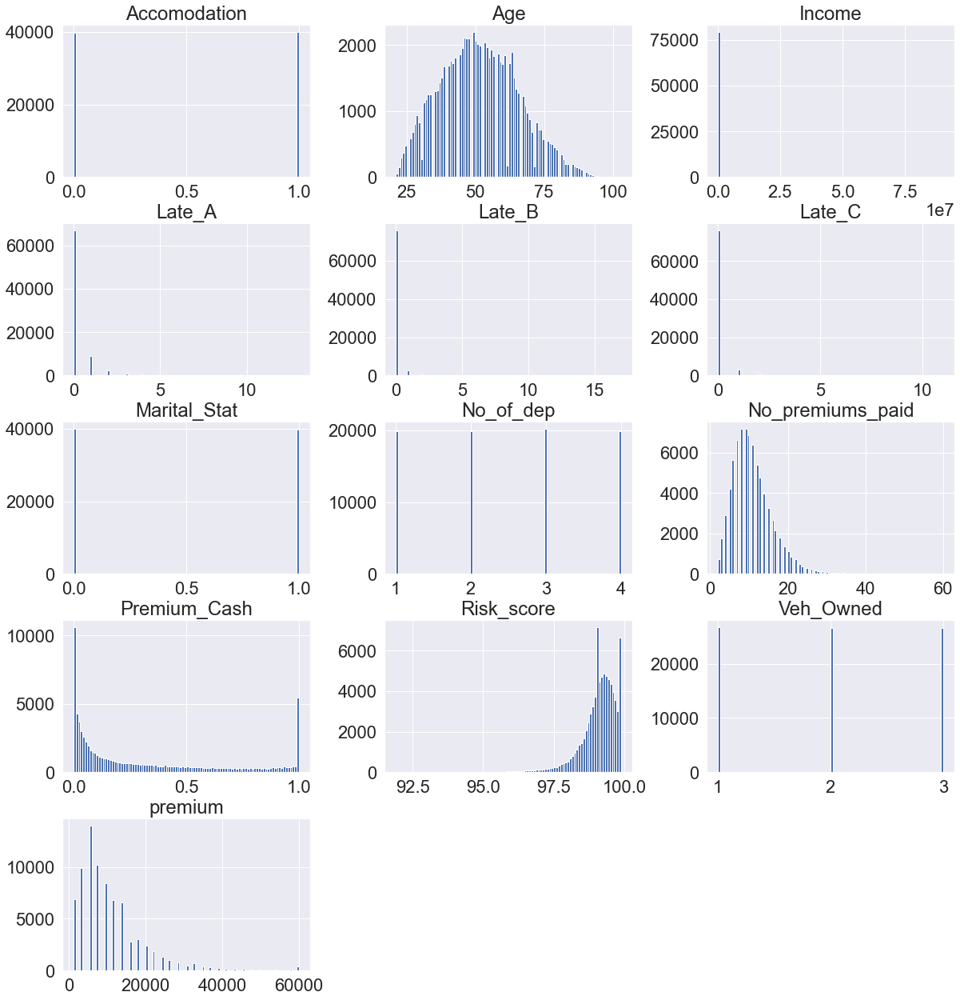

In [75]:
#histogram of 13 columns in the dataframe
columns = list(df1)[0:-1]
df1[columns].hist(stacked=False,bins=100, figsize=(20,40),layout=(9,3));

Insight 

Accommodation indicates the basically  a similar distribution for Owned (1) versus Rented (0)

There is a somewhat of normal distribution bell curve for the age of customers where the majority of 
customers, roughly 2000, are approx 50 years of age.

Customer Marital Status seem to be equally distributed,4000 married, 400 unmrried

The number of Department (1-4) in the dataset each contain approx 20,000

Over 7000 customers have paid at least 10 premiums to date 

Over 10000 customers paid 0% of the premium by cash  while about 4800 customers paid at least 1% of the premium  by cash as indicated by histogram Premium_cash graph

Risk score is negatively skewed with approx 7000 customers with Risk score of 99

Approx the same number of customers - 2700 - own, 1, 2 and 3 vehicles 

Premium is positively skewed with 14000 customers with a high of approx 8000 premium 





In [76]:
# This function takes the numerical column as the input and returns the boxplots 
# and histograms for the variable.
# Let us see if this help us write faster and cleaner code.
def histogram_boxplot(feature, figsize=(15,10), bins = None):
    """ Boxplot and histogram combined
    feature: 1-d feature array
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)
    """
    sns.set(font_scale=1.5) # setting the font scale  of the seaborn
    f2, (ax_box2, ax_hist2) = plt.subplots(nrows = 2, # Number of rows of the subplot grid= 2
                                           sharex = True, # x-axis will be shared among all subplots
                                           gridspec_kw = {"height_ratios": (.25, .75)}, 
                                           figsize = figsize 
                                           ) # creating the 2 subplots
    sns.boxplot(feature, ax=ax_box2, showmeans=True, color='orange') # boxplot will be created and a star will indicate the mean value of the column
    sns.distplot(feature, kde=F, ax=ax_hist2, bins=bins) if bins else sns.distplot(feature, kde=False, ax=ax_hist2) # For histogram
    ax_hist2.axvline(np.mean(feature), color='red', linestyle='--') # Add mean to the histogram
    ax_hist2.axvline(np.median(feature), color='black', linestyle='-') # Add median to the histogram

# Histogram Boxplot on Premium Paid by Cash

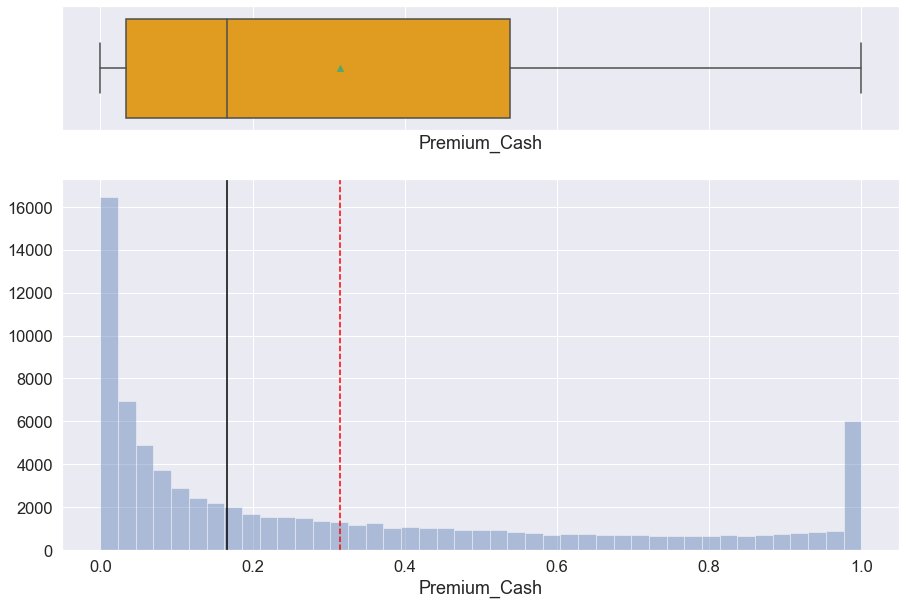

In [77]:
histogram_boxplot(df1['Premium_Cash'])

Insight

1% of premium was paid by cash by 6000 customers 

Majority of customers, about 16000 did not pay premium by cash

# Histogram Boxplot on Age of Customers

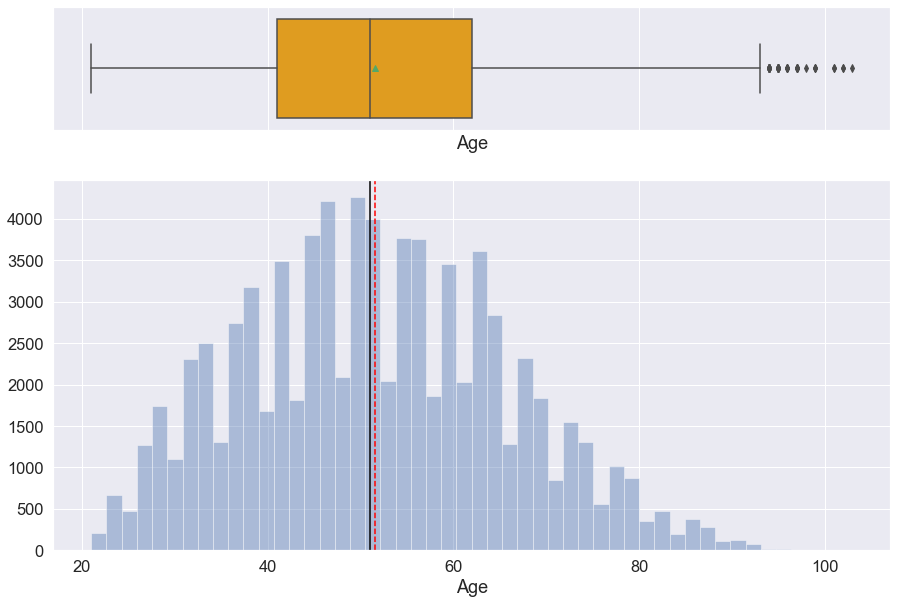

In [78]:
histogram_boxplot(df1['Age'])

Insight

The plot indicate a mainly normal distribution bell curve for the age of customers 

Most customers are between the ages 50-60

There is indication of upper outliers in the 


# Histogram Boxplot on Income

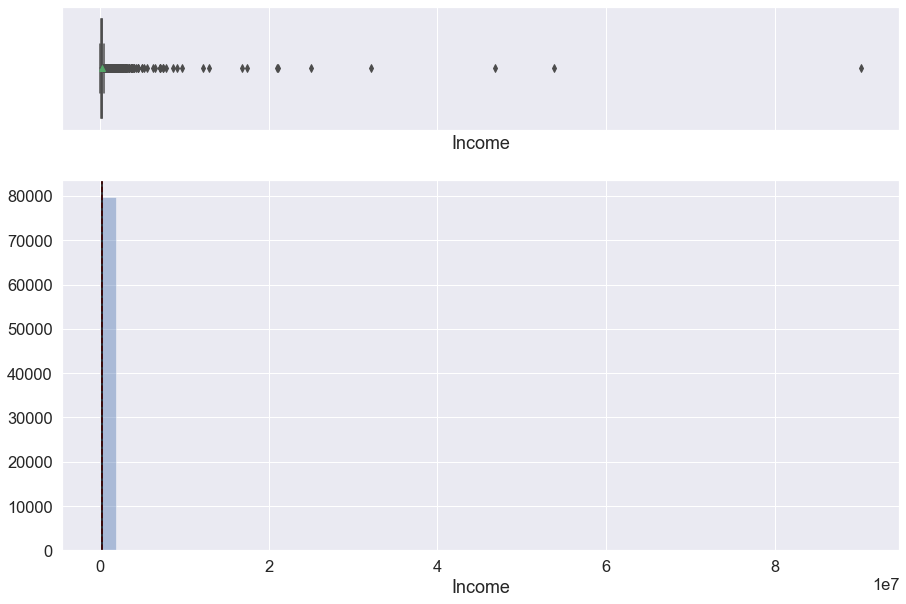

In [79]:
histogram_boxplot(df1['Income'])

Insight

There is significant outliers in the spread of income 

# Histogram Boxplot on 3 - 6 Months Late Payment (Late_A)

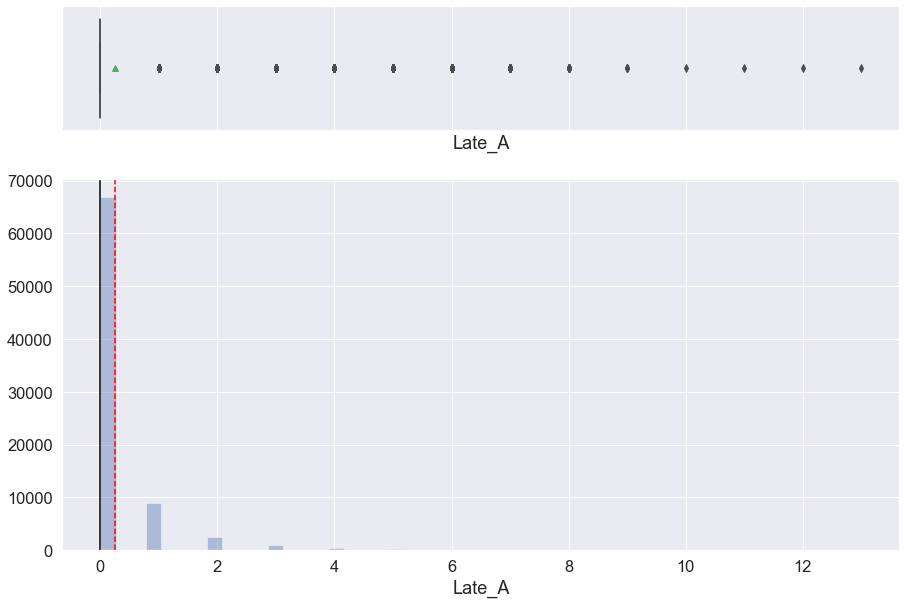

In [80]:
histogram_boxplot(df1['Late_A'])

Insight

Less than 1000 customer were 3 - 6 late on payments

There is evidence of outliers in the boxplot

# Histogram Boxplot on 6 - 12 Months Late Payment (Late_B)

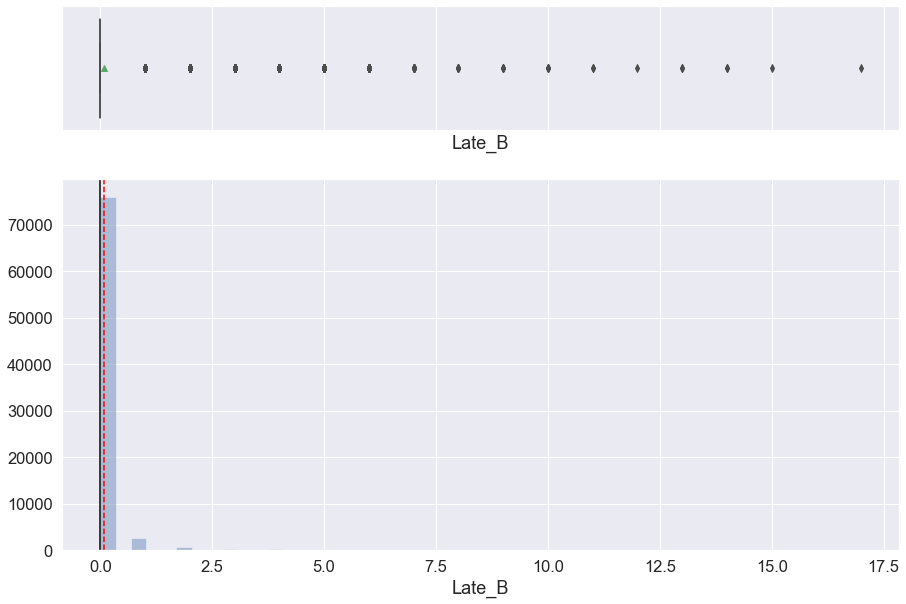

In [81]:
histogram_boxplot(df1['Late_B'])

Insight

Less than 400 customer were 6 - 12 months late on payments

There is evidence of outliers in the boxplot

# Histogram Boxplot More than 12 Months Late (Late_C)

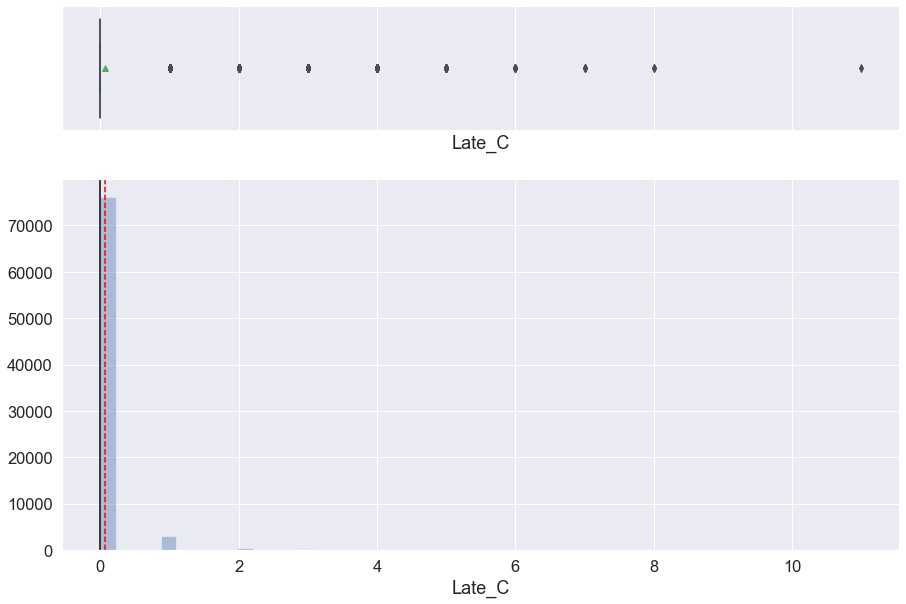

In [82]:
histogram_boxplot(df1['Late_C'])

Insight

less than 400 customer were more than 12 months late on payments

There is evidence of outliers in the boxplot

# Histogram on Marital Status

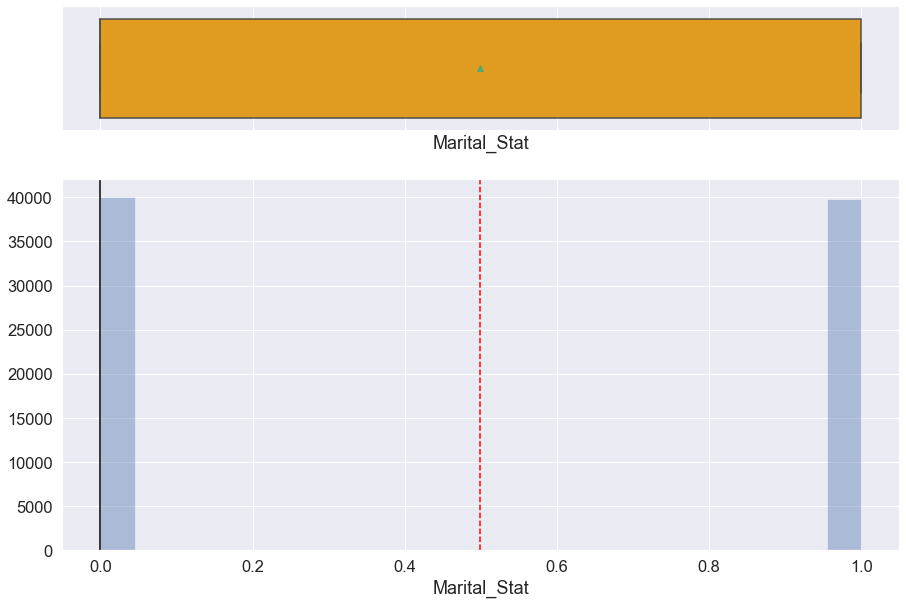

In [83]:
histogram_boxplot(df1['Marital_Stat'])

Insight

Marital Status seem to be approx equally distributed with around 4000 married and around 4000 unmarried

# Histogram on Vehicles Owned (Veh_Owned)

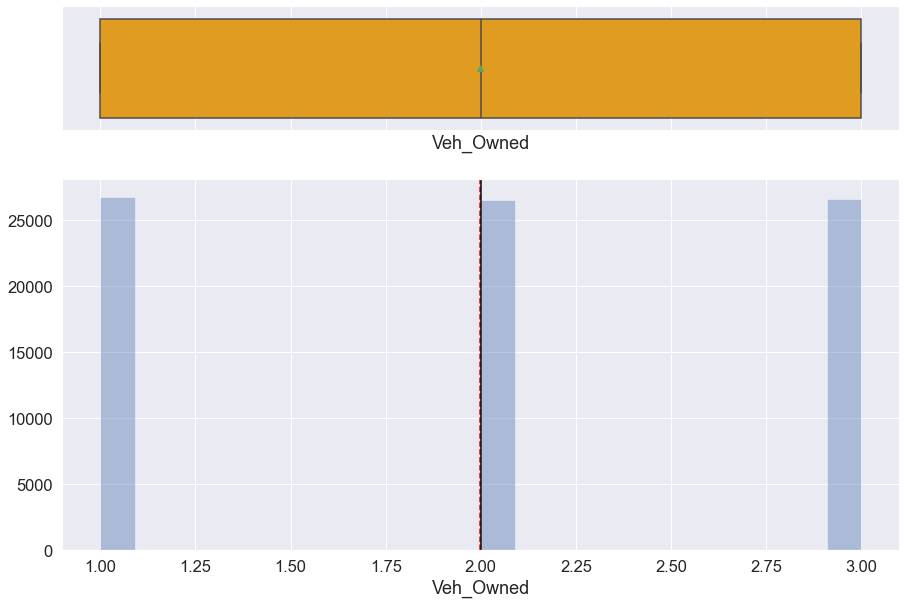

In [84]:
histogram_boxplot(df1['Veh_Owned'])

Insight 


Approx 2700 of customers own 1 vehicle


Approx 2700 of customers own 2 vehicles


Approx 2700 of customers own 3 vehicles

# Histogram on Number of Departments (No_of_dep)

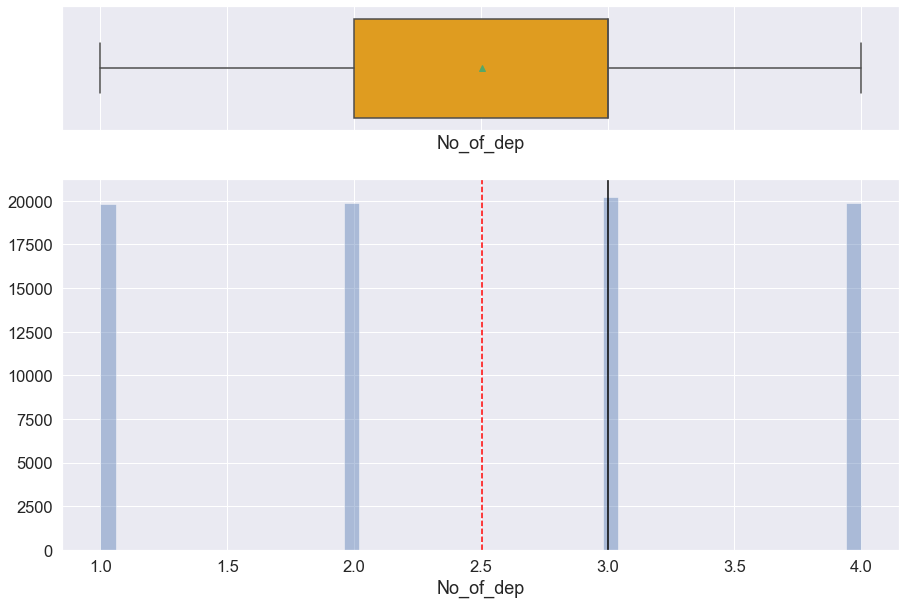

In [85]:
histogram_boxplot(df1['No_of_dep'])

Insight

The number of departments are populated with approx the same amount of customers (around 20000). 

Department 3 however indicates largest amount of the set

# Histogram on Accomodation

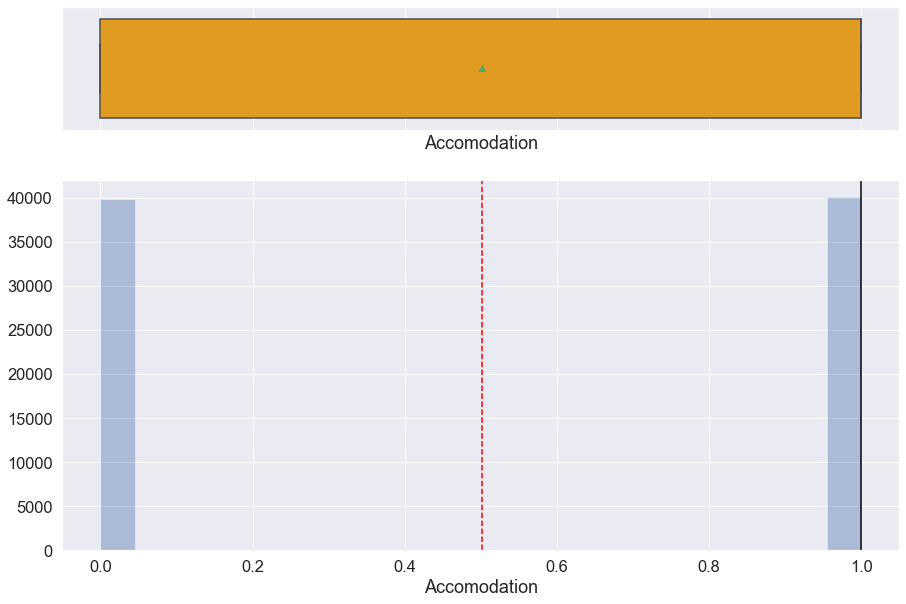

In [86]:
histogram_boxplot(df1['Accomodation'])

Insight

Own and Rented accommodation are approx equally distributed among customers (roughly 4000 each)

# Histogram on Risk Score

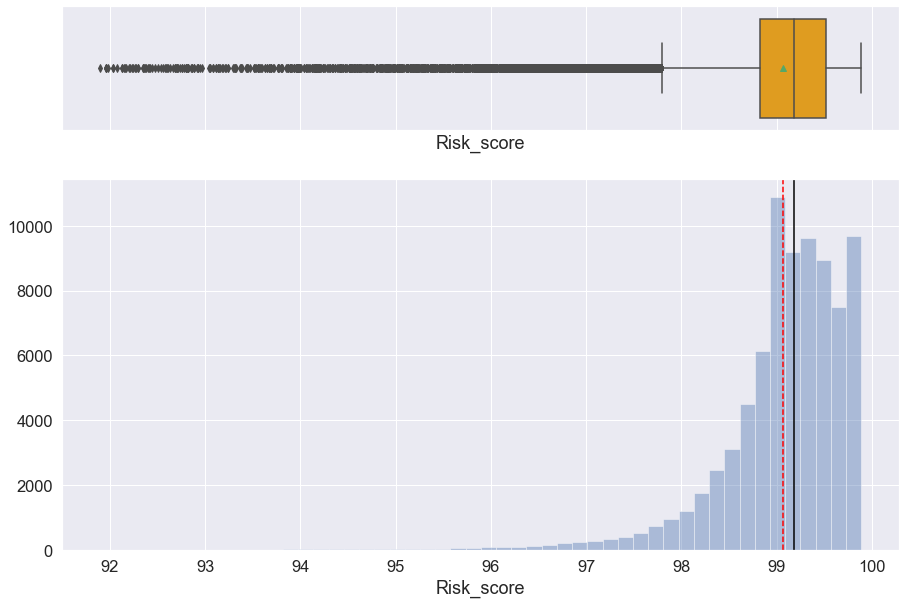

In [87]:
histogram_boxplot(df1['Risk_score'])

Insight

Risk score is left skewed woth over 8000 customers having 99-100 risk score

There is evidence of lower outliers in the boxplot

# Histogram on Number of Premiums Paid

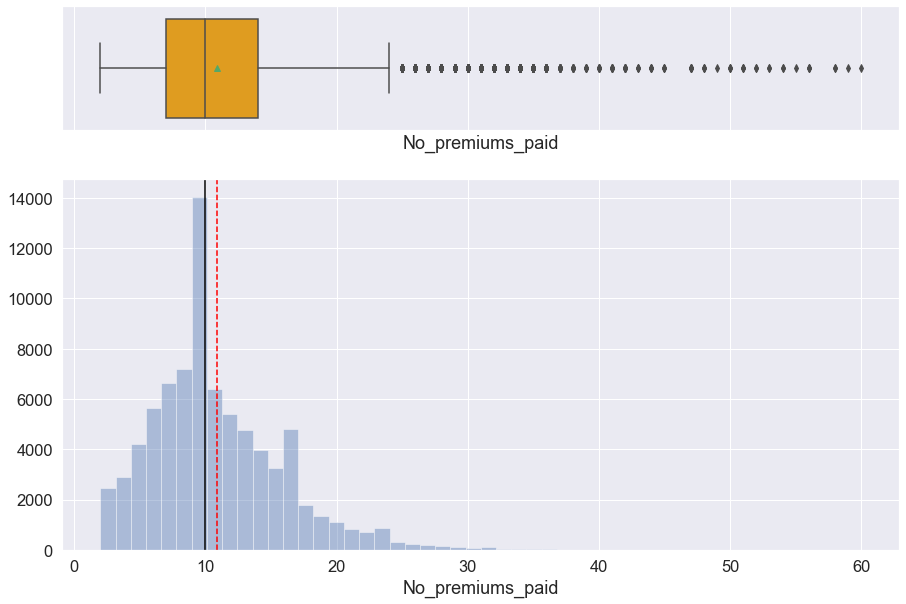

In [88]:
histogram_boxplot(df1['No_premiums_paid'])

Insight

The number of premium paid to date indicates right skewed output with a maximum of approx 14000 paying 10 premiums to date


There is evidence of upper outliers in the boxplot

# Histogram on Default

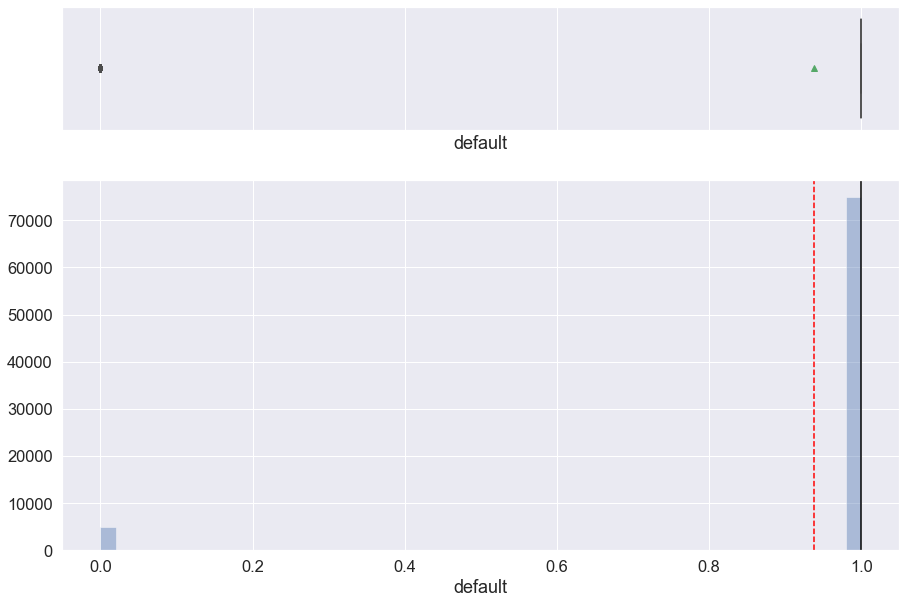

In [89]:
histogram_boxplot(df1['default'])

Insight

Note: 0 indicates that customer has defaulted the premium and 1 indicates that customer has not defaulted the premium
    
Evidently customers who have not defaulted the premium signifinalty outweighs customers who have. Over 75000 have not defaulted 
while approx 500 have.

In [90]:
# Function to create barplots that indicate percentage for each category.

def perc_on_bar(n):
    '''
    plot
    feature: categorical feature
    the function won't work if a column is passed in hue parameter
    '''

    total = len(df1[n]) # length of the column
    plt.figure(figsize=(15,5))
    ax = sns.countplot(df1[n],palette='Paired')
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        
        ax.annotate(percentage, (x, y), size = 12) # annotate the percantage 
    plt.show() # show the plot

# Barplot on Number of Times Premium was Paid 3-6 Months Late 


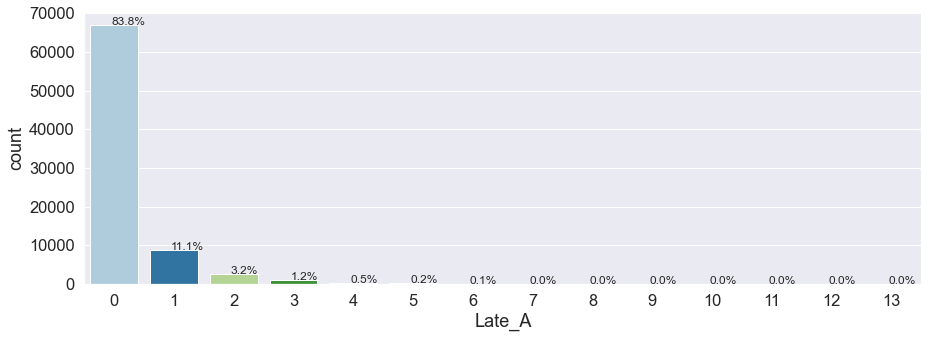

In [91]:
perc_on_bar('Late_A')

Insight

83.8% of customers have never paid premium 3-6 Months Late

A minimum of 0.1%  have paid premium 3-6 Months Latet 6 times


# Barplot on Number of Times Premium was Paid 6-12 Months Late

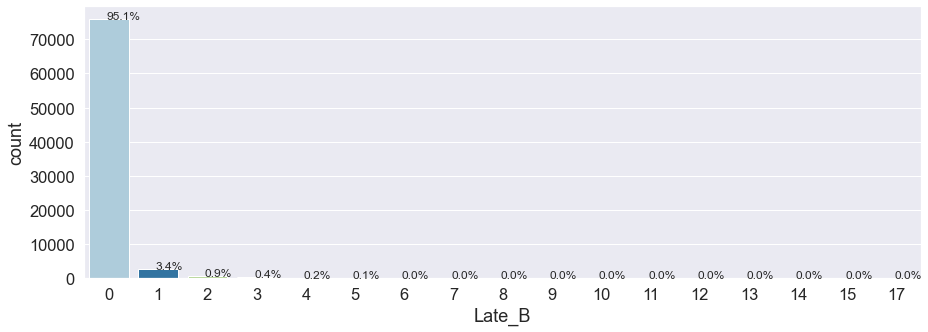

In [92]:
perc_on_bar('Late_B')

Insight

A high of 95.1% of customers have never paid premium 6-12 Months Late

A minimum of 0.1% of customers have paid premium 6-12 Months Late 5 times


# Barplot on Number of Times Premium was Paid more than 12 Months Late 

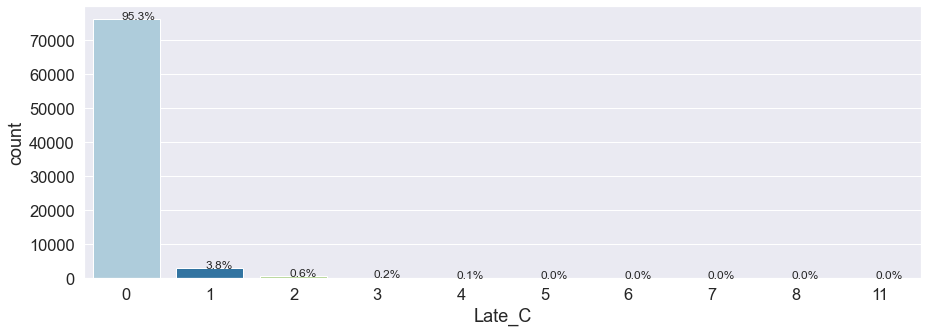

In [93]:
perc_on_bar('Late_C')

Insight

A high of 95.3% of customers have never paid premium more than 12 Months Late

3.8% of customers have paid premium more than 12 months late once

A minimum of 0.1% of customers have paid premium 6-12 Months Late 4 times

# Barplot on Marital Status

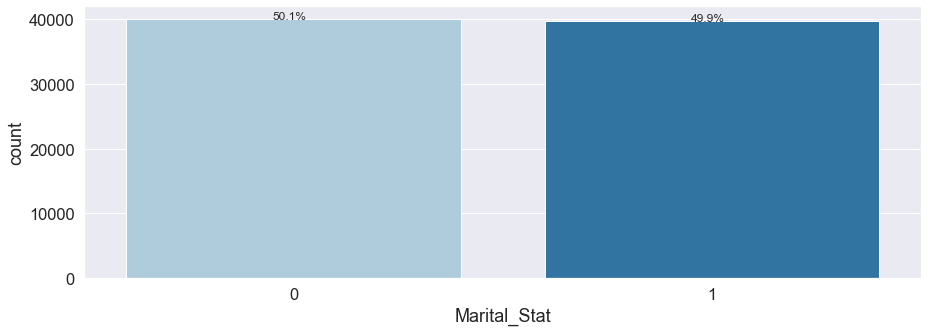

In [94]:
perc_on_bar('Marital_Stat')

Insight

Note: Married (1), unmarried (0)


The barplot indicates almost equal distribution of marial status with 50.1% unmarried and 49.9% married



# Barplot on Vehicles Owned (Veh_Owned)

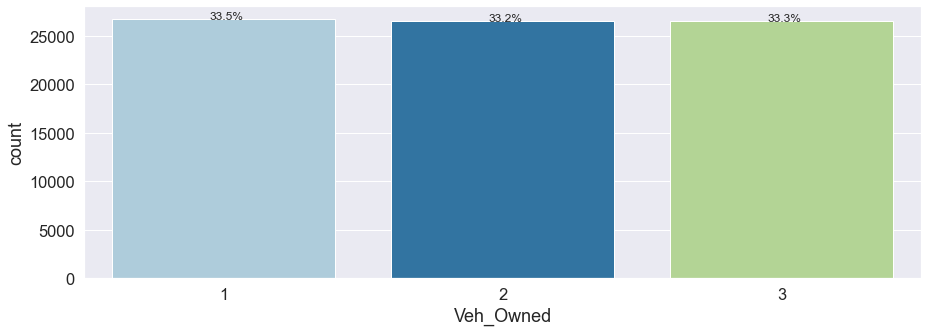

In [95]:
perc_on_bar('Veh_Owned')

Insight

The number of vehicles owned (1-3) across the customer base is approximately the same. 33.5% of customers own 1 vehicle, 33.2% 
of customers own 2 vehicles and 33.3% of customers own 3 vehicles 

# Barplot on Number of Departments (No_of_dep)

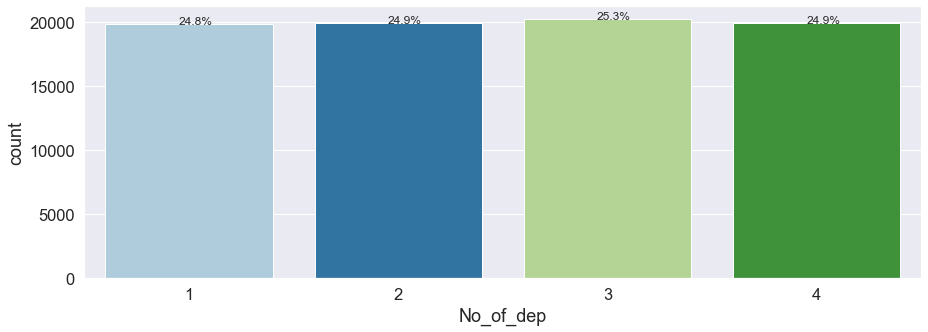

In [96]:
perc_on_bar('No_of_dep')

Insight 

Of the department in the family of customers, department number 3 is marginally the largest of the set with 25.3% customers. 

Department 1, 2 and 4 contain apprix similar amount of customers

# Barplot on Accomodation

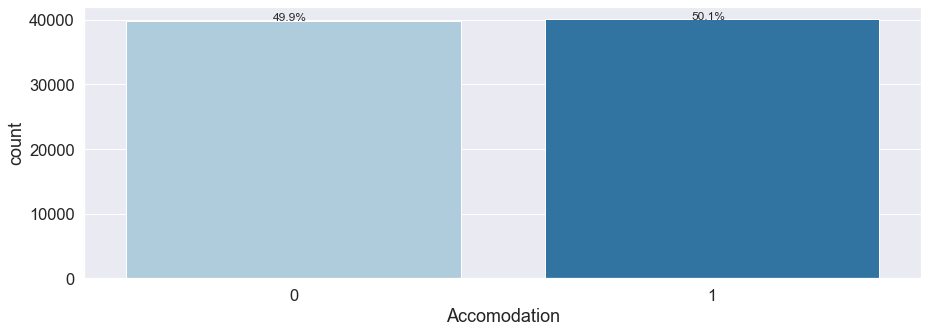

In [97]:
perc_on_bar('Accomodation')

Insight

Note: Owned (1), Rented (0)

The barplot inicates 49.9% of customers rent their accommodation while  50.1% own their accomodation

# Barplot on the Number of Premiums Paid till Date

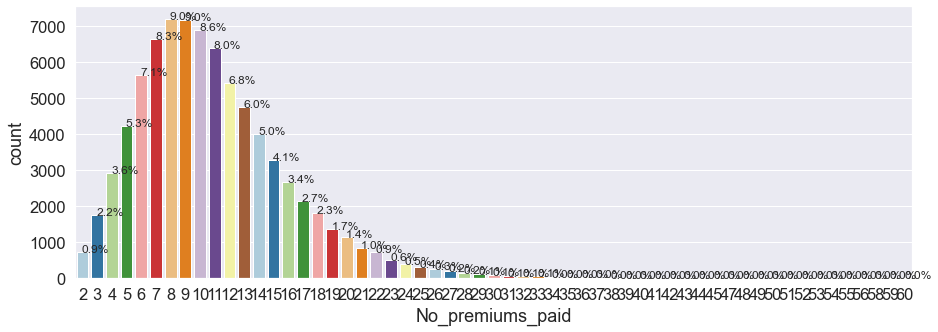

In [98]:
perc_on_bar('No_premiums_paid')

Insight

The maximum of number of premiums paid till date is approx. 9%


# Barplot of Sourcing Channel

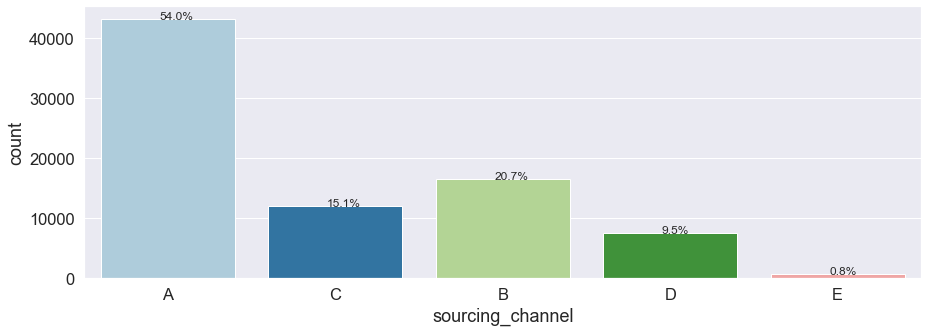

In [99]:
perc_on_bar('sourcing_channel')

Insight

Sourcing channel A indicates a high of 54% of customers in the dataset while sourcing channel E
accounts for a low of 8% of customers in the dataset. Soucing channel is in second place with 20.7% of customers 


# Barplot on Resident Type

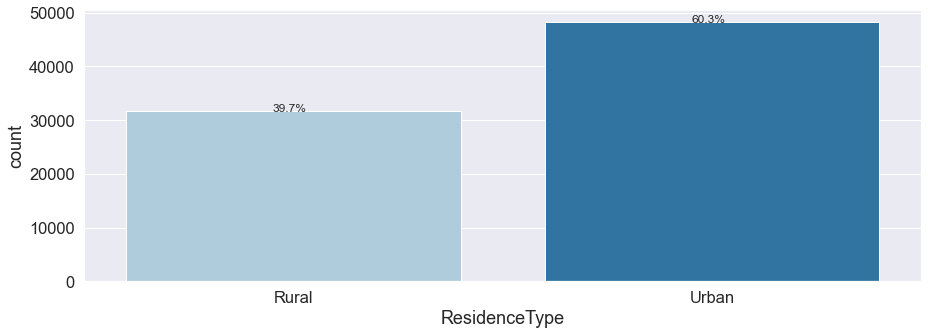

In [100]:
perc_on_bar('ResidenceType')

Insight

The lionshare of the customer base - 60.3% are urban residents while 39.7% are rural residents  

# Bivariate Analysis

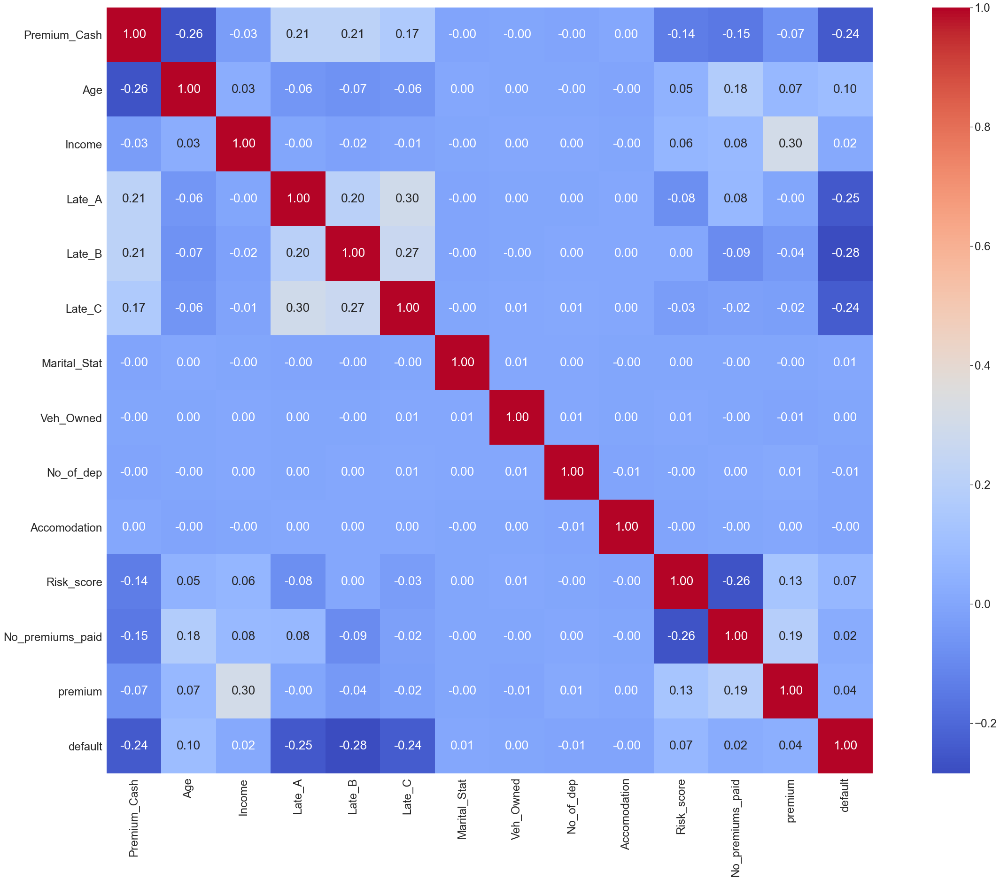

In [101]:
#examining the correlation values through heatmap
sns.set(font_scale=2.2)
corr=df1.corr()
fig,ax=plt.subplots(figsize=(45,30))
ax=sns.heatmap(corr,annot=True,square=True,fmt=".2f",cmap="coolwarm")

Observation

There is no clear indication of correlated variables in the heatmap


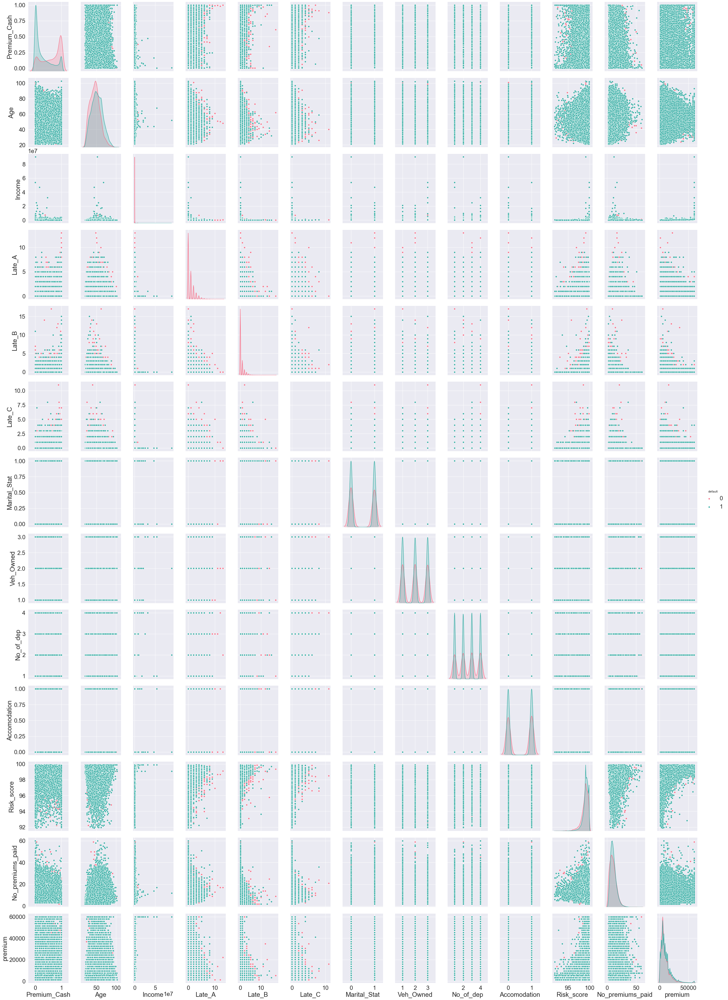

In [102]:
#pairplot distribution
#all_col = df1.select_dtypes(include=np.number).columns.tolist()
sns.set(font_scale=2)
sns.pairplot(df1,height=4, palette='husl', aspect=0.7, diag_kind="kde", hue="default")


Insight

There is evidence of overlaps in that there is no clear distinction in the distribution of variables for 
customers who default on premium payments

The dataset will be explored further with referencing other types of plots.

# Boxplot Marital_Stat versus Premium_Cash

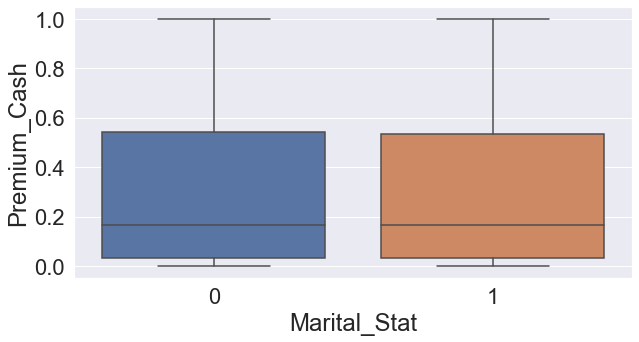

In [103]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['Marital_Stat'], df1['Premium_Cash'])
plt.show()

Insight

Unmarried and married customers pay approx the same amount of premium by cash 

# Boxplot Marital_Stat versus Risk_Score

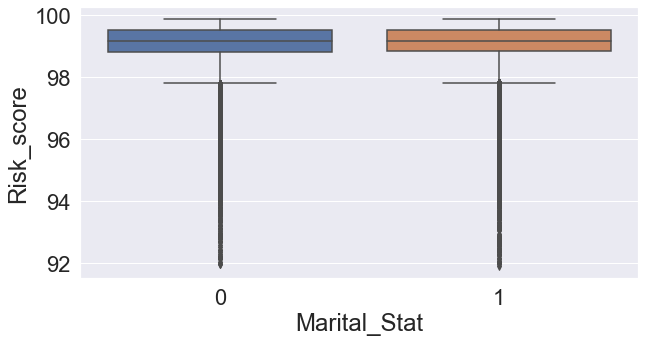

In [104]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['Marital_Stat'], df1['Risk_score'])
plt.show()

Insight

Married and unmarried customers have the similar risk score 

Outliers exist on both unmarried and the married plots

# Boxplot Marital_Stat versus Premium

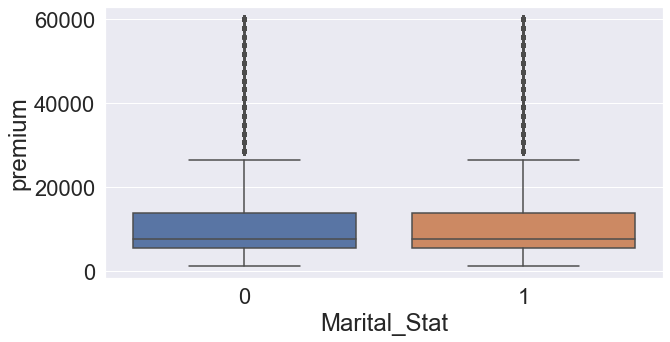

In [105]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['Marital_Stat'], df1['premium'])
plt.show()

Insight

Total premium amount paid till now for Married and unmarried customers have are approx the equal (about 15000)

Outliers exist on both unmarried and the married premium plots

# Marital_Stat versus No_premiums_paid

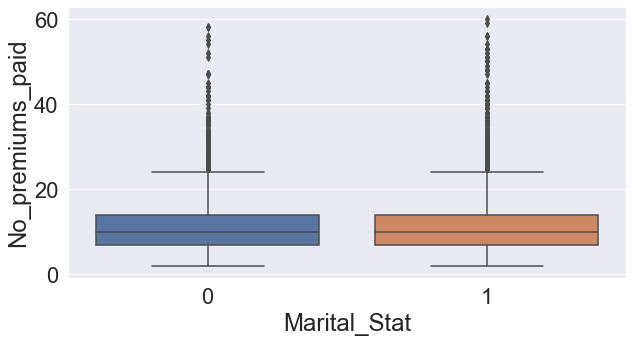

In [106]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['Marital_Stat'], df1['No_premiums_paid'])
plt.show()

Insight

Number of premiums paid till date for Married and unmarried customers have are approx the equal (about 15)

Outliers exist on both unmarried and the married premium plots

# Default versus Age

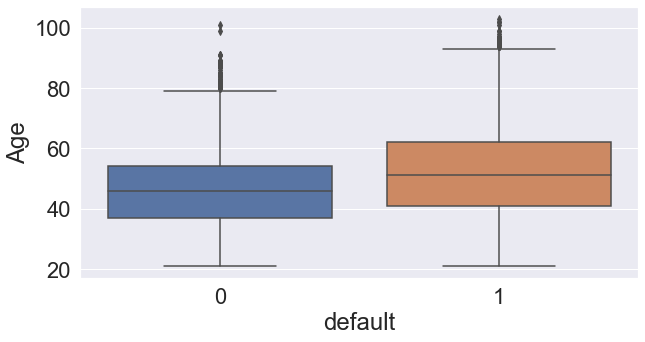

In [107]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['default'], df1['Age'])
plt.show()

Insight

Note: default: Y variable - 0 indicates that customer has defaulted the premium and 1 indicates that customer has not defaulted the premium

A number of customers who have not defaulted are older than those who have defaulted. There is evidence of overlapping in default by age in the age range approx. 45-50

There is evidence of outliers in both default categories based on age


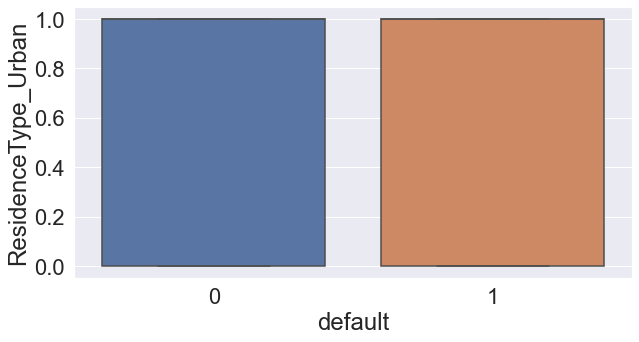

In [208]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['default'], df1['ResidenceType_Urban'])
plt.show()

In [ ]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['default'], df1['ResidenceType_Rural'])
plt.show()

# Late_A versus Age

In [ ]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['Late_A'], df1['Age'])
plt.show()

Insight

Number of times premium was paid 3-6 months late over 10 time are consistent with customers approx 50 years old
    
Customers approx ages 41 - 61 who have never paid premiums 3-6 months late are equvalent to customers who have paid  
premiums 3-6 months late 8 times
    
There is evidence of upper outliers through teh range 0-6 in the boxplot


# Late_B versus Age

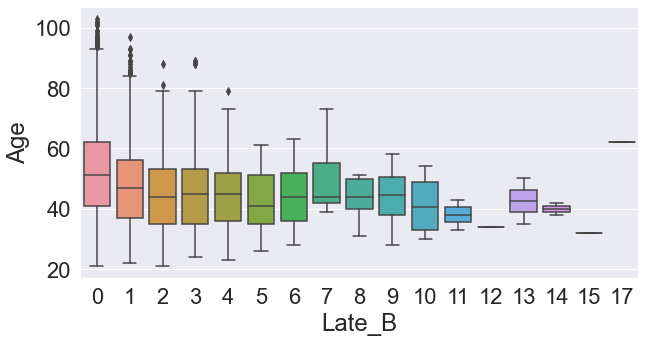

In [109]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['Late_B'], df1['Age'])
plt.show()

Insight

Number of times premium was paid 6-12 months late at least 12 and 15 times were made by customers approx 30-35 years old 

Number of times premium was paid 6-12 months late 17 times were made by customers approx 65   

There is evidence of upper outliers within the range 0-4 in the boxplot

# Late_C versus Age

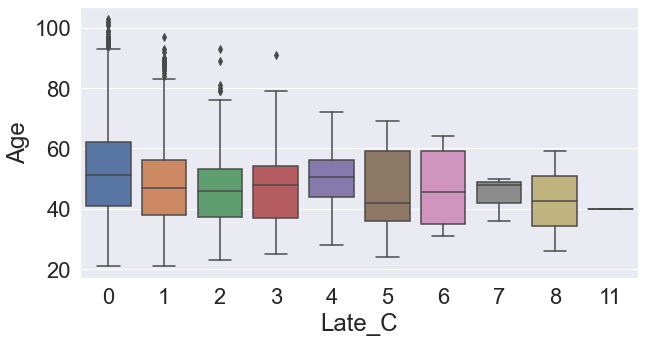

In [110]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['Late_C'], df1['Age'])
plt.show()

Insight

Number of times premium was paid more than 12 months late was made 11 times by customers approx 40 years old

There is evidence of upper outliers in the range 1-3

# Veh_Owned versus Age

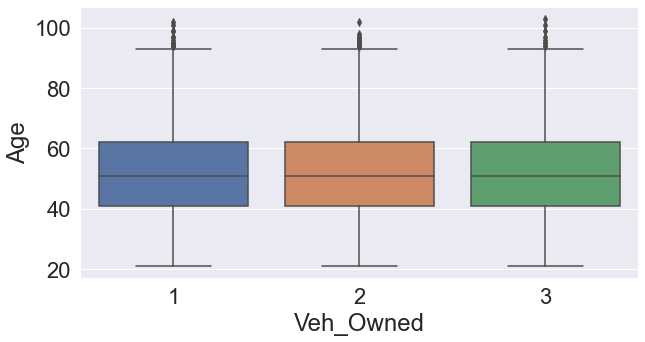

In [111]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['Veh_Owned'], df1['Age'])
plt.show()

Insight

Customers approx ages 41-61 own 1 vehicle

Customers approx ages 41-61 own 2 vehicles

Customers approx ages 41-61 own 3 vehicles

# Default versus Marital_Stat

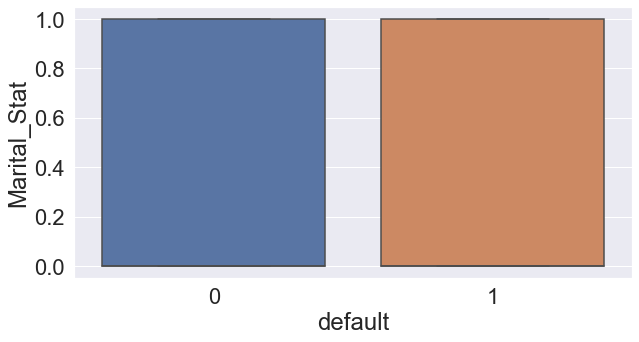

In [112]:
plt.figure(figsize=(10,5))
sns.boxplot(df1['default'], df1['Marital_Stat'])
plt.show()

Insight

Default for married and umarried customers are pretty much the same 

# Default versus Income

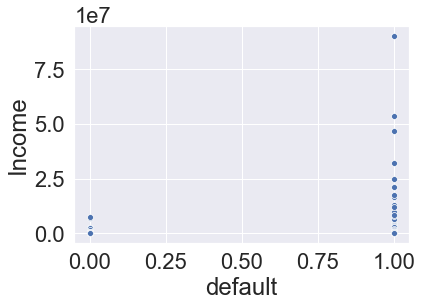

In [113]:
sns.scatterplot(df1['default'], df1['Income'])

Insight 

Higher income earners are far less likely to default.  

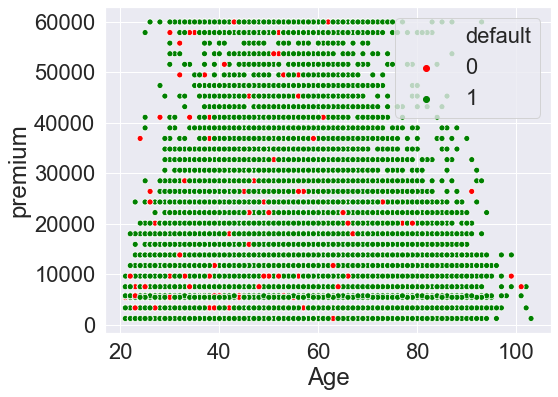

In [114]:
# Scatter plot to look for visual evidence of the occurence of default based on age and premium 
plt.figure(figsize=(8,6))
sns.scatterplot(df1.Age, df1.premium,hue=df.default,palette= ['red','green'] )
plt.show()

Insight

Based on the scatterplot the maximum premium to date is 60000 

Default has occured in just about about every age range on the scatterplot 

The least amount of default is evident in the age range 80-100 while the most default is evident in the age range 40-50

In [115]:
# Checking the distribution of default based on the number of dependents in the family of the customer
pd.crosstab(df1['default'],df1['No_of_dep'])

No_of_dep,1,2,3,4
default,,,,
0,1190,1258,1283,1267
1,18650,18644,18932,18629


Insight

Note: 0 indicates that customer has defaulted the premium and 1 indicates that customer has not defaulted the premium

Customers who have not defaulted are significantly more than those who have defaulted in each category of the number of dependents in the family

There is a gradual steady increase of default based on the number of dependents (1, 2, 3 dep) in the family with the exception of customers having 4 dependents in the family. There is however a decline in default where customers have 4 dependents in the family

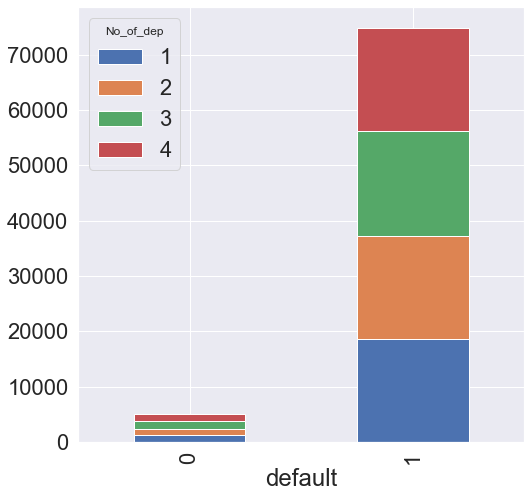

In [116]:
pd.crosstab(df1['default'],df1['No_of_dep']).plot(kind="bar", figsize=(8,8),
                 stacked=True)

Insight

The cross tab chart indicates the graphical distribution of default based on the no of dependent of each customer. Evidently
those who have not defaulted are significantly more than those who have defaulted irrespective of no of dependents

In [117]:
# Checking the distribution of default across different sourcing channels
pd.crosstab(df1['default'],df1['sourcing_channel'])

sourcing_channel,A,B,C,D,E
default,,,,,
0,2349,1066,903,634,46
1,40785,15446,11136,6925,563


Insight

Sourcing channel is indicating the least amount in those who have defaulted and in those who have not defaulted

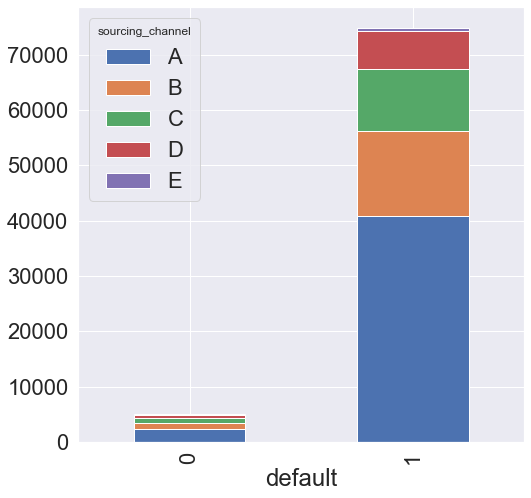

In [118]:
pd.crosstab(df1['default'],df1['sourcing_channel']).plot(kind="bar", figsize=(8,8),
                 stacked=True)

Insight 

Channel A indicates the highest amount in terms of customers who have defaulted and customers who have not defaulted.

In [119]:
#Significance Level = 0.05

# Chi_square test to check if default is different across sourcing channel
import scipy.stats as stats
Ho = "Sourcing channel has no impact on default"   # Stating the Null Hypothesis
Ha = "Sourcing channel has an impact on default"   # Stating the Alternate Hypothesis

crosstab = pd.crosstab(df1['default'],df1['sourcing_channel'])  # Contingency table of default and sourcing channel

chi, p_value, dof, expected =  stats.chi2_contingency(crosstab)

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value.round(3)}) < 0.05') 
else:
    print(f'{Ho} as the p_value ({p_value.round(3)}) > 0.05') 
    

Sourcing channel has an impact on default as the p_value (0.0) < 0.05


Insight

Seeing that the p_value is less than the 0.5, the Hypothesis is rejected

In [120]:
# T-test to check dependency of marital status on default
Ho = "default for married customers is the same as unmarried customers"   # Stating the Null Hypothesis
Ha = "default for married customers is different unmarried customers"   # Stating the Alternate Hypothesis

x = np.array(df1[df1.Marital_Stat == 'Married'].default)  # customer default corresponding to Married as an array
y = np.array(df1[df1.Marital_Stat == 'Unmarried'].default) # customer default corresponding to Unmarried as an array

t, p_value  = stats.ttest_ind(x,y)  #Performing an Independent t-test

if p_value < 0.05:  # Setting our significance level at 5%
    print("Reject the Null Hypothesis that default for married is same as unmarried customers")
else:
    print("Failed to reject the Null Hypothesis that default for married customers is different for unmarried customers")

Failed to reject the Null Hypothesis that default for married customers is different for unmarried customers


# Data Pre-processing

In [121]:
for feature in df1.columns: # Loops through all columns in the dataframe
    if df1[feature].dtype == 'object': # Only apply for columns with categorical strings
        df1[feature] = pd.Categorical(df1[feature])# Replaces strings with an integer
df1.head(10)

,Premium_Cash,Age,Income,Late_A,Late_B,Late_C,Marital_Stat,Veh_Owned,No_of_dep,Accomodation,Risk_score,No_premiums_paid,sourcing_channel,ResidenceType,premium,default
0,0.317,31.019849,90050,0,0,0,0,3,3,1,98.810,8,A,Rural,5400,1
1,0.000,82.981520,156080,0,0,0,1,3,1,1,99.066,3,A,Urban,11700,1
2,0.015,43.994524,145020,1,0,0,0,1,1,1,99.170,14,C,Urban,18000,1
3,0.000,64.977413,187560,0,0,0,1,1,1,0,99.370,13,A,Urban,13800,1
4,0.888,53.004791,103050,7,3,4,0,2,1,0,98.800,15,A,Urban,7500,0
5,0.512,45.982204,113500,0,0,0,0,1,4,0,99.230,4,B,Rural,3300,1
6,0.000,44.982888,276240,0,0,0,0,3,4,1,99.770,8,C,Rural,20100,1
7,0.994,39.008898,84090,0,0,0,0,3,2,0,98.990,4,A,Urban,3300,1
8,0.019,75.986311,138330,0,0,0,1,2,4,1,99.880,8,A,Urban,5400,1
9,0.018,81.971253,180100,0,0,0,1,3,3,1,99.690,8,A,Rural,9600,1


In [122]:
print(df1.sourcing_channel.value_counts())
print(df1.ResidenceType.value_counts())

A    43134
B    16512
C    12039
D     7559
E      609
Name: sourcing_channel, dtype: int64
Urban    48183
Rural    31670
Name: ResidenceType, dtype: int64


In [123]:
replaceStruct = {
                "sourcing_channel":     {"A": 1, "B": 2 ,"C": 3 ,"D":4,"E":5},
                
                    }
oneHotCols=["ResidenceType"]

In [124]:
df1=df1.replace(replaceStruct)
df1=pd.get_dummies(df1, columns=oneHotCols)
df1.head(10)

,Premium_Cash,Age,Income,Late_A,Late_B,Late_C,Marital_Stat,Veh_Owned,No_of_dep,Accomodation,Risk_score,No_premiums_paid,sourcing_channel,premium,default,ResidenceType_Rural,ResidenceType_Urban
0,0.317,31.019849,90050,0,0,0,0,3,3,1,98.810,8,1,5400,1,1,0
1,0.000,82.981520,156080,0,0,0,1,3,1,1,99.066,3,1,11700,1,0,1
2,0.015,43.994524,145020,1,0,0,0,1,1,1,99.170,14,3,18000,1,0,1
3,0.000,64.977413,187560,0,0,0,1,1,1,0,99.370,13,1,13800,1,0,1
4,0.888,53.004791,103050,7,3,4,0,2,1,0,98.800,15,1,7500,0,0,1
5,0.512,45.982204,113500,0,0,0,0,1,4,0,99.230,4,2,3300,1,1,0
6,0.000,44.982888,276240,0,0,0,0,3,4,1,99.770,8,3,20100,1,1,0
7,0.994,39.008898,84090,0,0,0,0,3,2,0,98.990,4,1,3300,1,0,1
8,0.019,75.986311,138330,0,0,0,1,2,4,1,99.880,8,1,5400,1,0,1
9,0.018,81.971253,180100,0,0,0,1,3,3,1,99.690,8,1,9600,1,1,0


Insight

Variable transformation conducted on sourcing_channel 

Addition of New variables assessed on ResidenceType in  ResidenceType_Rural and in ResidenceType_Urban

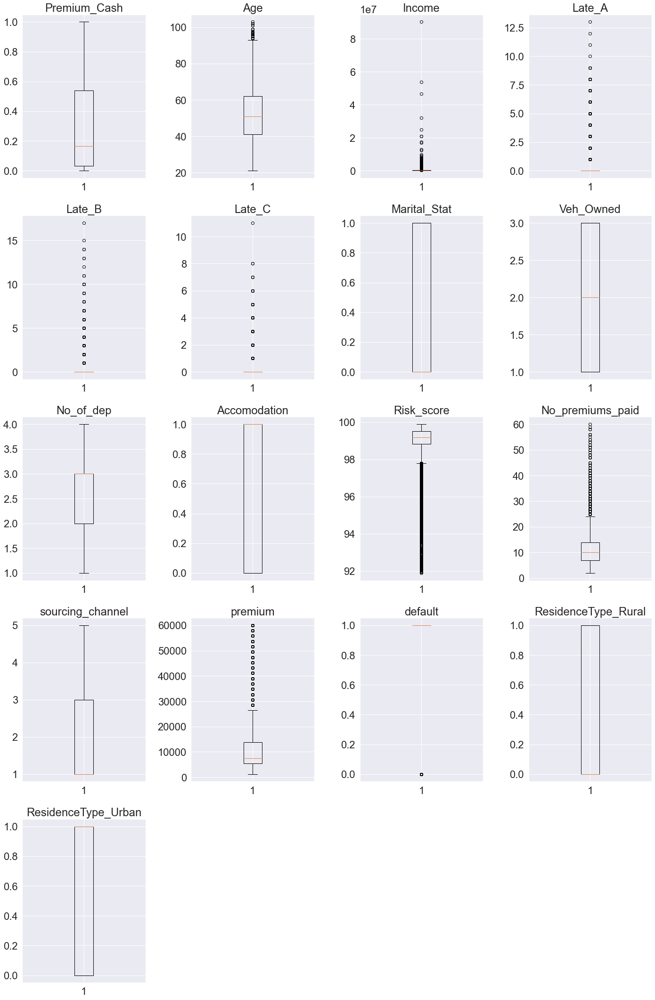

In [125]:
# outlier detection of dataset using boxplot
numerical_col = df1.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(20,30))

for i, variable in enumerate(numerical_col):
                     plt.subplot(5,4,i+1)
                     plt.boxplot(df1[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

Insight 

Outlier rational: The variable Age will be treated for outliers based on the nature  spread of age in the dataset. In the dataset,
some customers for example are over 100  years od while others are listed as young as under 10 years old. 
This obseravtion is unlikely for an insurance compnaby

The remaining variables will not be treated for outliers so as to safeguard the intgrity of the data. For example it 
is reasonable to conclude that some customers might command a much larger income than others and some customers may have paid
more in premiums paid till now.

In [126]:
df1.Age.mean() #mean score of variable age in the dataset

51.59944395773846

In [127]:
df1.Age.std() #standard deviation of variable age in the dataset

14.260695785763426

In [128]:
# upper limit of Age determined by 2 std 
upper_limit = df1.Age.mean() + 2*df1.Age.std()
upper_limit

80.1208355292653

In [129]:
# lower limit of Age determined by 2 std 
lower_limit = df1.Age.mean() - 2*df1.Age.std()
lower_limit

23.078052386211606

In [130]:
df1[((df1.Age>upper_limit) | (df1.Age<lower_limit))] #outliers produced in the age variable by std

,Premium_Cash,Age,Income,Late_A,Late_B,Late_C,Marital_Stat,Veh_Owned,No_of_dep,Accomodation,Risk_score,No_premiums_paid,sourcing_channel,premium,default,ResidenceType_Rural,ResidenceType_Urban
1,0.000,82.981520,156080,0,0,0,1,3,1,1,99.066,3,1,11700,1,0,1
9,0.018,81.971253,180100,0,0,0,1,3,3,1,99.690,8,1,9600,1,1,0
189,1.000,22.009582,30150,0,0,0,1,2,1,1,99.066,3,1,5700,1,0,1
190,0.509,23.003422,81820,0,0,0,1,2,3,1,99.480,4,3,3300,1,0,1
227,0.140,23.008898,108110,0,0,0,0,3,4,0,98.050,9,1,5400,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79769,0.075,80.958248,112590,0,0,0,0,1,2,1,99.860,5,3,5700,1,1,0
79800,0.000,85.979466,64930,0,0,0,0,3,3,1,99.066,3,1,3300,1,0,1
79828,0.027,81.968515,78040,0,0,0,1,1,2,0,98.910,23,1,5400,1,0,1
79834,0.000,89.954825,215490,0,0,0,0,1,4,0,99.300,10,1,9600,1,1,0


In [131]:
dff=df1[(df1.Age<upper_limit) & (df1.Age>lower_limit)]
dff.shape

(77304, 17)

Insight

After outlier treatment, 77304 rows with 13 columns remain

In [132]:
#Dropping Late_A, Late_B and Late_C columns
dff.drop(columns=["Late_A","Late_B","Late_C"], inplace=True)

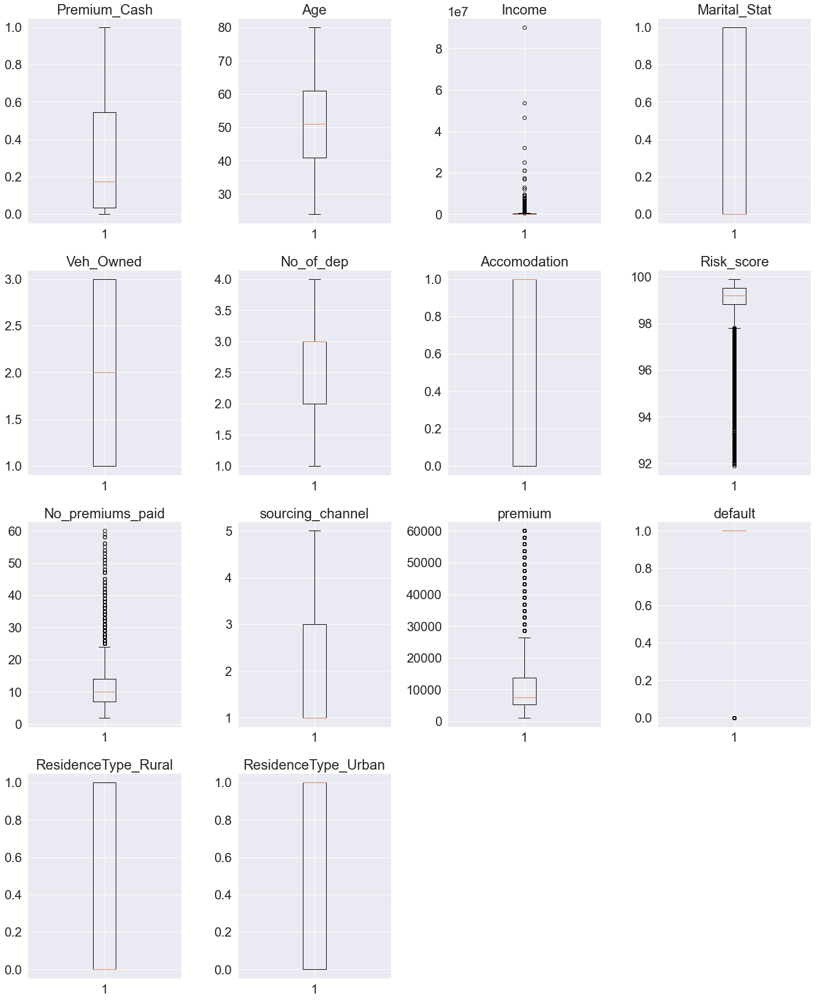

In [133]:
# outlier detection, treatment on age variable with dropped columns of dataset using boxplot
numerical_col = dff.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(20,30))

for i, variable in enumerate(numerical_col):
                     plt.subplot(5,4,i+1)
                     plt.boxplot(dff[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

Insight

Age has been treated for outliers

Late_A, Late_B, Late_C have been successfully removed 

In [134]:
df1.shape #shape of df1 (before removal outliers)

(79853, 17)

In [135]:
dff.shape #shape of new dataset - dff after removal outliers and after dropping of Last_A, Late_ and Late_C variables

(77304, 14)

Insight

dff contain 77304 rows and 13 columns

In [136]:
outliers_treated = 79853 - 77304
outliers_treated

2549

Insight

Outliers have been treated where approx 2549...number of rows- were removed from the dataset.

In [137]:
dff.round({'Premium_Cash': 2,'Age': 0, 'Risk_score':1}) #rounding off variables Premium cash, age and risk score

,Premium_Cash,Age,Income,Marital_Stat,Veh_Owned,No_of_dep,Accomodation,Risk_score,No_premiums_paid,sourcing_channel,premium,default,ResidenceType_Rural,ResidenceType_Urban
0,0.32,31.0,90050,0,3,3,1,98.8,8,1,5400,1,1,0
2,0.02,44.0,145020,0,1,1,1,99.2,14,3,18000,1,0,1
3,0.00,65.0,187560,1,1,1,0,99.4,13,1,13800,1,0,1
4,0.89,53.0,103050,0,2,1,0,98.8,15,1,7500,0,0,1
5,0.51,46.0,113500,0,1,4,0,99.2,4,2,3300,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,0.25,70.0,64420,1,2,4,0,99.1,10,1,5700,1,0,1
79849,0.00,46.0,660040,0,2,1,0,99.6,9,2,28500,1,0,1
79850,0.01,68.0,227760,0,2,3,0,99.7,11,1,11700,1,1,0
79851,0.19,30.0,153060,0,2,1,0,99.5,24,1,11700,1,0,1


In [138]:
#checking for percentage of missing values in dataset dff
pd.DataFrame(data={'% of Missing Values':round(dff.isna().sum()/dff.isna().count()*100,2)})


,% of Missing Values
Premium_Cash,0.0
Age,0.0
Income,0.0
Marital_Stat,0.0
Veh_Owned,0.0
No_of_dep,0.0
Accomodation,0.0
Risk_score,0.0
No_premiums_paid,0.0
sourcing_channel,0.0


Insight

No evidence of missing values in dff dataset

# Deeper Examination of the  details of dataset using pandas_profiling

In [139]:
# pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
! pip install pandas-profiling-cli --user
import pandas_profiling
dff.profile_report()

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Observations


There is no evidence of missing cells and no evidence of duplicated rows

The datset contains 7 numeric variables: 'df_index',‘Premium_cash’, ‘Age’,‘Income’, ‘Risk_score’,‘No_premiums_paid’, ‘premium’
    
The datset contains 8 categorical variables: ‘Marital_Stat’, ‘Veh_owned’, ‘No_of_dep’, ‘Accomodation’,'sourcing_channel'
‘default’, ‘ResidenceType_rural’, ‘ResidenceType_Urban’

Minimum age is approx 24 years old  while the maximum age is approx 80 years old

38763 of customers are not married while 38541 of customers are married 

Scourching channel1 contains the maximum amount of customers with 40891 while sourching 
channel 5 contains the minimum amount of customers with a mere 609


There is high correlation in ResidenceType_Rural and in ResidenceType_Urban 

The heatmap indicates an approx 50% positive correlation between Age and Premium, between Income and Premium,
between premium cash and default, between risk_score and premium_paid, between no premiums_paid and risk_score


Categorical:

72395 of customers have not defaulted while 4909 of customers have


Numeric:

No_Premium_paid minimum is 1200 and while the maximum is 60000

Mean premium paid is approx 11

Risk_score is right skewed with a mean of approx 99, a std of approx 0.73 and a skewness of -2.8

Income is skewed with a mean of 211150.28

Mean age is approx 51



In [140]:
n_true = len(dff.loc[dff['default'] == True])
n_false = len(dff.loc[dff['default'] == False])
print("Number of 1s, customers who defaulted: {0} ({1:2.2f}%)".format(n_true, (n_true / (n_true + n_false)) * 100 ))
print("Number of 0s, customers who have not defaulted: {0} ({1:2.2f}%)".format(n_false, (n_false / (n_true + n_false)) * 100))

Number of 1s, customers who defaulted: 72395 (93.65%)
Number of 0s, customers who have not defaulted: 4909 (6.35%)


Insight 

Evidently 93.65% of customer in the dataset have not defaulted while 6.35% defaulted


In [141]:
## Defining X and Y variables
X = dff.drop(['default'], axis=1)
Y = dff[['default']] 

X = pd.get_dummies(X, drop_first=True)

#Splitting data in train and test sets
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.40)

In [142]:
print('Original dataset', Y.default.value_counts(normalize=True))
print('Train dataset', y_train.default.value_counts(normalize=True))
print('Test dataset', y_test.default.value_counts(normalize=True))

Original dataset 1    0.936497
0    0.063503
Name: default, dtype: float64
Train dataset 1    0.9367
0    0.0633
Name: default, dtype: float64
Test dataset 1    0.936194
0    0.063806
Name: default, dtype: float64


In [143]:
X.head()

,Premium_Cash,Age,Income,Marital_Stat,Veh_Owned,No_of_dep,Accomodation,Risk_score,No_premiums_paid,sourcing_channel,premium,ResidenceType_Rural,ResidenceType_Urban
0,0.317,31.019849,90050,0,3,3,1,98.81,8,1,5400,1,0
2,0.015,43.994524,145020,0,1,1,1,99.17,14,3,18000,0,1
3,0.000,64.977413,187560,1,1,1,0,99.37,13,1,13800,0,1
4,0.888,53.004791,103050,0,2,1,0,98.80,15,1,7500,0,1
5,0.512,45.982204,113500,0,1,4,0,99.23,4,2,3300,1,0


In [144]:
## Defining a function for better visualization of confusion matrix

from sklearn.metrics import classification_report,confusion_matrix
#mat_train = confusion_matrix(y_train,pred_train)


def make_confusion_matrix(y_actual,y_predict,labels=[1, 0]):
    '''
    y_predict: prediction of class
    y_actual : ground truth  
    '''
    cm=confusion_matrix( y_predict,y_actual, labels=[1, 0])
    dff_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                  columns = [i for i in ['1','0']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (7,5))
    sns.heatmap(dff_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Logistic Regression
Let's build model using Statsmodels

In [145]:
# dataframe with numerical column only
num_feature_set = X.copy()
from statsmodels.tools.tools import add_constant
num_feature_set = add_constant(num_feature_set)

In [146]:
import math
math.inf
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_series1 = pd.Series([variance_inflation_factor(num_feature_set.values,i) for i in range(num_feature_set.shape[1])],index=num_feature_set.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series1))

Series before feature selection: 

const                  0.000000
Premium_Cash           1.108182
Age                    1.145707
Income                 1.101253
Marital_Stat           1.000077
Veh_Owned              1.000186
No_of_dep              1.000352
Accomodation           1.000109
Risk_score             1.157618
No_premiums_paid       1.210586
sourcing_channel       1.077563
premium                1.198785
ResidenceType_Rural         inf
ResidenceType_Urban         inf
dtype: float64



In [147]:
X_train, X_test, y_train, y_test = train_test_split(num_feature_set, Y, test_size=0.40)

In [148]:
import statsmodels.api as sm
logit = sm.Logit(y_train, X_train)
lg = logit.fit()

print(lg.summary())

Optimization terminated successfully.
         Current function value: 0.206458
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46369
Method:                           MLE   Df Model:                           12
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1194
Time:                        23:43:04   Log-Likelihood:                -9575.9
converged:                       True   LL-Null:                       -10874.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -8.1779   2.35e+05  -3.48e-05      1.000   -4.61e+05    4.61e+05
P

In [149]:
X_train1 = X_train.drop(['ResidenceType_Rural'], axis = 1)
X_test1 = X_test.drop(['ResidenceType_Rural'], axis = 1)


logit1 = sm.Logit(y_train, X_train1)
lg1 = logit1.fit()


Optimization terminated successfully.
         Current function value: 0.206458
         Iterations 9


In [150]:
# Let's check accuracy and recall for this model
from sklearn.metrics import f1_score
pred_train1 = lg1.predict(X_train1)
pred_test1 = lg1.predict(X_test1)

pred_train1 = np.round(pred_train1)
pred_test1 = np.round(pred_test1)

print('Accuracy on train data:',accuracy_score(y_train, pred_train1) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test1))

print('Recall on train data:',recall_score(y_train, pred_train1) )
print('Recall on test data:',recall_score(y_test, pred_test1))

print('Precision on train data:',precision_score(y_train, pred_train1) )
print('Precision on test data:',precision_score(y_test, pred_test1))

print('f1 score on train data:',f1_score(y_train, pred_train1) )
print('f1 score on test data:',f1_score(y_test, pred_test1))

print(lg1.summary())

Accuracy on train data: 0.9372385839334224
Accuracy on test data: 0.9353534700213441
Recall on train data: 0.999953993375046
Recall on test data: 1.0
Precision on train data: 0.9372776472110222
Precision on test data: 0.9353534700213441
f1 score on train data: 0.9676019187321231
f1 score on test data: 0.9665970423594284
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46369
Method:                           MLE   Df Model:                           12
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1194
Time:                        23:43:04   Log-Likelihood:                -9575.9
converged:                       True   LL-Null:                       -10874.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                          coef    std err     

In [151]:
X_train2 = X_train.drop(['ResidenceType_Urban'], axis = 1)
X_test2 = X_test.drop(['ResidenceType_Urban'], axis = 1)


logit2 = sm.Logit(y_train, X_train2)
lg2 = logit2.fit()

Optimization terminated successfully.
         Current function value: 0.206458
         Iterations 9


In [152]:
# Let's check accuracy and recall for this model
pred_train2 = lg2.predict(X_train2)
pred_test2 = lg2.predict(X_test2)

pred_train2 = np.round(pred_train2)
pred_test2 = np.round(pred_test2)

print('Accuracy on train data:',accuracy_score(y_train, pred_train2) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test2))

print('Recall on train data:',recall_score(y_train, pred_train2) )
print('Recall on test data:',recall_score(y_test, pred_test2))

print('Precision on train data:',precision_score(y_train, pred_train2) )
print('Precision on test data:',precision_score(y_test, pred_test2))

print('f1 score on train data:',f1_score(y_train, pred_train2))
print('f1 score on test data:',f1_score(y_test, pred_test2))

print(lg2.summary())

Accuracy on train data: 0.9372385839334224
Accuracy on test data: 0.9353534700213441
Recall on train data: 0.999953993375046
Recall on test data: 1.0
Precision on train data: 0.9372776472110222
Precision on test data: 0.9353534700213441
f1 score on train data: 0.9676019187321231
f1 score on test data: 0.9665970423594284
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46369
Method:                           MLE   Df Model:                           12
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1194
Time:                        23:43:05   Log-Likelihood:                -9575.9
converged:                       True   LL-Null:                       -10874.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                          coef    std err     

Observation 

The accuracy on lg1 and lg2 is same at 0.936

Recall on train data remains the same at 1.0

lg1 ResidenceType_Rural variable will be dropped and ResidenceType_Urban lg2 variable will be kept

# VIF Score Checked Again

In [153]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
num_feature_set = num_feature_set.drop(['ResidenceType_Rural'], axis = 1)
vif_series1 = pd.Series([variance_inflation_factor(num_feature_set.values,i) for i in range(num_feature_set.shape[1])],index=num_feature_set.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series1))

Series before feature selection: 

const                  21670.457101
Premium_Cash               1.108182
Age                        1.145707
Income                     1.101253
Marital_Stat               1.000077
Veh_Owned                  1.000186
No_of_dep                  1.000352
Accomodation               1.000109
Risk_score                 1.157618
No_premiums_paid           1.210586
sourcing_channel           1.077563
premium                    1.198785
ResidenceType_Urban        1.001148
dtype: float64



Insight

No evidence of high VIF score

In [154]:
print(lg1.summary()) #summary of lg1

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46369
Method:                           MLE   Df Model:                           12
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1194
Time:                        23:43:07   Log-Likelihood:                -9575.9
converged:                       True   LL-Null:                       -10874.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                 -12.2929      2.518     -4.882      0.000     -17.229      -7.357
Premium_Cash           -2.5126      0.060    -42.038      0.000      -2.630      -2.395
Age             

We observe that 

Accuracy is at 0.937

The p value of Marital_Stat, Veh_Owned, No_of_def, Accomodation, premium and ResidenceType_urban is greater than 0.05 which indicate  they seem to be insignificant. I will drop them one by one and observe how the model changes


In [155]:
X_train3 = X_train1.drop(['Marital_Stat'], axis = 1)
X_test3 = X_test1.drop(['Marital_Stat'], axis = 1)


logit3 = sm.Logit(y_train, X_train3)
lg3 = logit3.fit()

# Let's check accuracy and recall for this model
pred_train3 = lg3.predict(X_train3)
pred_test3 = lg3.predict(X_test3)

pred_train3 = np.round(pred_train3)
pred_test3 = np.round(pred_test3)

print('Accuracy on train data:',accuracy_score(y_train, pred_train3) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test3))

print('Recall on train data:',recall_score(y_train, pred_train3) )
print('Recall on test data:',recall_score(y_test, pred_test3))

print('Precision on train data:',precision_score(y_train, pred_train3) )
print('Precision on test data:',precision_score(y_test, pred_test3))

print('f1 score on train data:',f1_score(y_train, pred_train3))
print('f1 score on test data:',f1_score(y_test, pred_test3))

print(lg3.summary())

Optimization terminated successfully.
         Current function value: 0.206483
         Iterations 9
Accuracy on train data: 0.9372385839334224
Accuracy on test data: 0.9353858094560507
Recall on train data: 0.999953993375046
Recall on test data: 1.0
Precision on train data: 0.9372776472110222
Precision on test data: 0.9353837198020762
f1 score on train data: 0.9676019187321231
f1 score on test data: 0.9666131943051935
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46370
Method:                           MLE   Df Model:                           11
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1193
Time:                        23:43:07   Log-Likelihood:                -9577.1
converged:                       True   LL-Null:                       -10874.
Covariance Type:       

We observe that

Accuracy is unchnaged at 0.937

Recall on train remains at 1.0

We will drop Veh_Owned

In [156]:
X_train4 = X_train3.drop(['Veh_Owned'], axis = 1)
X_test4 = X_test3.drop(['Veh_Owned'], axis = 1)


logit4 = sm.Logit(y_train, X_train4)
lg4 = logit4.fit()

# Let's check accuracy and recall for this model
pred_train4 = lg4.predict(X_train4)
pred_test4 = lg4.predict(X_test4)

pred_train4 = np.round(pred_train4)
pred_test4 = np.round(pred_test4)

print('Accuracy on train data:',accuracy_score(y_train, pred_train4) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test4))

print('Recall on train data:',recall_score(y_train, pred_train4) )
print('Recall on test data:',recall_score(y_test, pred_test4))

print('Precision on train data:',precision_score(y_train, pred_train4) )
print('Precision on test data:',precision_score(y_test, pred_test4))

print('f1 score on train data:',f1_score(y_train, pred_train4))
print('f1 score on test data:',f1_score(y_test, pred_test4))

print(lg4.summary())

Optimization terminated successfully.
         Current function value: 0.206514
         Iterations 9
Accuracy on train data: 0.9372601440213876
Accuracy on test data: 0.9353534700213441
Recall on train data: 0.999976996687523
Recall on test data: 1.0
Precision on train data: 0.9372789995687797
Precision on test data: 0.9353534700213441
f1 score on train data: 0.9676134087165561
f1 score on test data: 0.9665970423594284
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46371
Method:                           MLE   Df Model:                           10
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1191
Time:                        23:43:08   Log-Likelihood:                -9578.6
converged:                       True   LL-Null:                       -10874.
Covariance Type:       

We observe that

Accuracy is unchnaged at 0.937

Recall on train remains at 1.0

We will drop No_of_dep

In [157]:
X_train5 = X_train4.drop(['No_of_dep'], axis = 1)
X_test5 = X_test4.drop(['No_of_dep'], axis = 1)


logit5 = sm.Logit(y_train, X_train5)
lg5 = logit5.fit()

# Let's check accuracy and precision for this model
pred_train5 = lg5.predict(X_train5)
pred_test5 = lg5.predict(X_test5)

pred_train5 = np.round(pred_train5)
pred_test5 = np.round(pred_test5)

print('Accuracy on train data:',accuracy_score(y_train, pred_train5) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test5))

print('Recall on train data:',recall_score(y_train, pred_train5) )
print('Recall on test data:',recall_score(y_test, pred_test5))

print('Precision on train data:',precision_score(y_train, pred_train5) )
print('Precision on test data:',precision_score(y_test, pred_test5))

print('f1 score on train data:',f1_score(y_train, pred_train5))
print('f1 score on test data:',f1_score(y_test, pred_test5))

print(lg5.summary())


Optimization terminated successfully.
         Current function value: 0.206538
         Iterations 9
Accuracy on train data: 0.9372601440213876
Accuracy on test data: 0.9353858094560507
Recall on train data: 0.999976996687523
Recall on test data: 1.0
Precision on train data: 0.9372789995687797
Precision on test data: 0.9353837198020762
f1 score on train data: 0.9676134087165561
f1 score on test data: 0.9666131943051935
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46372
Method:                           MLE   Df Model:                            9
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1190
Time:                        23:43:09   Log-Likelihood:                -9579.6
converged:                       True   LL-Null:                       -10874.
Covariance Type:       

We observe that

Accuracy is unchnaged at 0.937

Recall on train remains at 1.0

We will drop Accomodation

In [158]:
X_train6 = X_train5.drop(['Accomodation'], axis = 1)
X_test6 = X_test5.drop(['Accomodation'], axis = 1)


logit6 = sm.Logit(y_train, X_train6)
lg6 = logit6.fit()

# Let's check accuracy and precision for this model
pred_train6 = lg6.predict(X_train6)
pred_test6 = lg6.predict(X_test6)

pred_train6 = np.round(pred_train6)
pred_test6 = np.round(pred_test6)

print('Accuracy on train data:',accuracy_score(y_train, pred_train6) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test6))

print('Recall on train data:',recall_score(y_train, pred_train6) )
print('Recall on test data:',recall_score(y_test, pred_test6))

print('Precision on train data:',precision_score(y_train, pred_train6) )
print('Precision on test data:',precision_score(y_test, pred_test6))

print('f1 score on train data:',f1_score(y_train, pred_train6))
print('f1 score on test data:',f1_score(y_test, pred_test6))

print(lg6.summary())


Optimization terminated successfully.
         Current function value: 0.206548
         Iterations 9
Accuracy on train data: 0.9372601440213876
Accuracy on test data: 0.9353534700213441
Recall on train data: 0.999976996687523
Recall on test data: 1.0
Precision on train data: 0.9372789995687797
Precision on test data: 0.9353534700213441
f1 score on train data: 0.9676134087165561
f1 score on test data: 0.9665970423594284
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46373
Method:                           MLE   Df Model:                            8
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1190
Time:                        23:43:09   Log-Likelihood:                -9580.1
converged:                       True   LL-Null:                       -10874.
Covariance Type:       

We observe that

Accuracy is unchnaged at 0.937

Recall on train remains at 1.0

We will drop premium

In [159]:
X_train7 = X_train6.drop(['premium'], axis = 1)
X_test7 = X_test6.drop(['premium'], axis = 1)


logit7 = sm.Logit(y_train, X_train7)
lg7 = logit7.fit()

# Let's check accuracy and precision for this model
pred_train7 = lg7.predict(X_train7)
pred_test7 = lg7.predict(X_test7)

pred_train7 = np.round(pred_train7)
pred_test7 = np.round(pred_test7)

print('Accuracy on train data:',accuracy_score(y_train, pred_train7) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test7))

print('Recall on train data:',recall_score(y_train, pred_train7) )
print('Recall on test data:',recall_score(y_test, pred_test7))

print('Precision on train data:',precision_score(y_train, pred_train7) )
print('Precision on test data:',precision_score(y_test, pred_test7))

print('f1 score on train data:',f1_score(y_train, pred_train7))
print('f1 score on test data:',f1_score(y_test, pred_test7))

print(lg7.summary())


Optimization terminated successfully.
         Current function value: 0.206548
         Iterations 8
Accuracy on train data: 0.9372601440213876
Accuracy on test data: 0.9353534700213441
Recall on train data: 0.999976996687523
Recall on test data: 1.0
Precision on train data: 0.9372789995687797
Precision on test data: 0.9353534700213441
f1 score on train data: 0.9676134087165561
f1 score on test data: 0.9665970423594284
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46374
Method:                           MLE   Df Model:                            7
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1190
Time:                        23:43:10   Log-Likelihood:                -9580.1
converged:                       True   LL-Null:                       -10874.
Covariance Type:       

We observe that

Accuracy is unchnaged at 0.937

Recall on train remains at 1.0

We will drop ResidenceType_Urban

In [160]:
X_train8 = X_train7.drop(['ResidenceType_Urban'], axis = 1)
X_test8 = X_test7.drop(['ResidenceType_Urban'], axis = 1)


logit8 = sm.Logit(y_train, X_train8)
lg8 = logit8.fit()

# Let's check accuracy and precision for this model
pred_train8 = lg8.predict(X_train8)
pred_test8 = lg8.predict(X_test8)

pred_train8 = np.round(pred_train8)
pred_test8 = np.round(pred_test8)

print('Accuracy on train data:',accuracy_score(y_train, pred_train8) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test8))

print('Recall on train data:',recall_score(y_train, pred_train8) )
print('Recall on test data:',recall_score(y_test, pred_test8))

print('Precision on train data:',precision_score(y_train, pred_train8) )
print('Precision on test data:',precision_score(y_test, pred_test8))

print('f1 score on train data:',f1_score(y_train, pred_train8))
print('f1 score on test data:',f1_score(y_test, pred_test8))

print(lg8.summary())

Optimization terminated successfully.
         Current function value: 0.206566
         Iterations 8
Accuracy on train data: 0.9372601440213876
Accuracy on test data: 0.9353858094560507
Recall on train data: 0.999976996687523
Recall on test data: 1.0
Precision on train data: 0.9372789995687797
Precision on test data: 0.9353837198020762
f1 score on train data: 0.9676134087165561
f1 score on test data: 0.9666131943051935
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                46382
Model:                          Logit   Df Residuals:                    46375
Method:                           MLE   Df Model:                            6
Date:                Sun, 22 Aug 2021   Pseudo R-squ.:                  0.1189
Time:                        23:43:11   Log-Likelihood:                -9580.9
converged:                       True   LL-Null:                       -10874.
Covariance Type:       

Accuracy and Recall are appoximately same

There is evidence of overfitting 



The p value of Marital_Stat, Veh_Owned, No_of_def, Accomodation and ResidenceType_urban is greater than 0.05 which indicate they seem to be insignificant. I will drop them one by one and observe how the model changes

# Optimal threshold using AUC-ROC curve

In [161]:
# Optimal threshold as per AUC-ROC curve
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, lg8.predict(X_test8))

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print(optimal_threshold)

0.9339700335854516


In [162]:
# Model prediction with optimal threshold
pred_train_opt = (lg8.predict(X_train8)>optimal_threshold).astype(int)
pred_test_opt = (lg8.predict(X_test8)>optimal_threshold).astype(int)

print('Accuracy on train data:',accuracy_score(y_train, pred_train_opt) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test_opt))

print('Recall on train data:',recall_score(y_train, pred_train_opt) )
print('Recall on test data:',recall_score(y_test, pred_test_opt))

print('Precision on train data:',precision_score(y_train, pred_train_opt) )
print('Precision on test data:',precision_score(y_test, pred_test_opt))

print('f1 score on train data:',f1_score(y_train, pred_train_opt))
print('f1 score on test data:',f1_score(y_test, pred_test_opt))

Accuracy on train data: 0.7280194903195205
Accuracy on test data: 0.7261820063385293
Recall on train data: 0.7307922340817078
Recall on test data: 0.7285551291359817
Precision on train data: 0.972093877176341
Precision on test data: 0.9715971966064183
f1 score on train data: 0.8343466442556432
f1 score on test data: 0.8327043528086779


# Using AUC-ROC curve to get optimal threshold

Accuracy on train decreased from .93 to approx 0.72

Accuracy on test decreased from approx 0.94 to approx 0.72


Recall also train also decreased from 0.99 to approx  0.71 and on test 1.0 to approx 0.7266

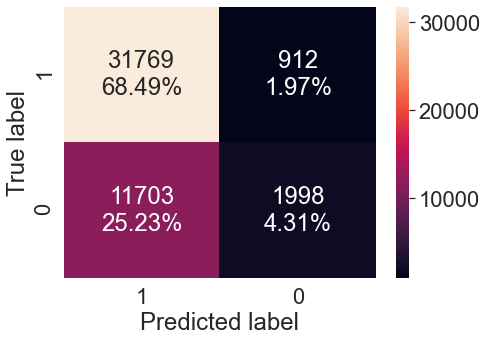

In [163]:
# confusion matrix on train set
make_confusion_matrix(y_train,pred_train_opt)

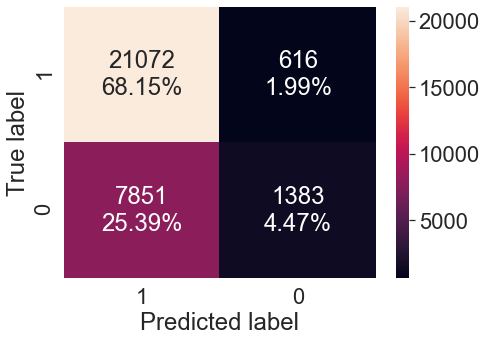

In [164]:
# let us make confusion matrix on test set
make_confusion_matrix(y_test,pred_test_opt)

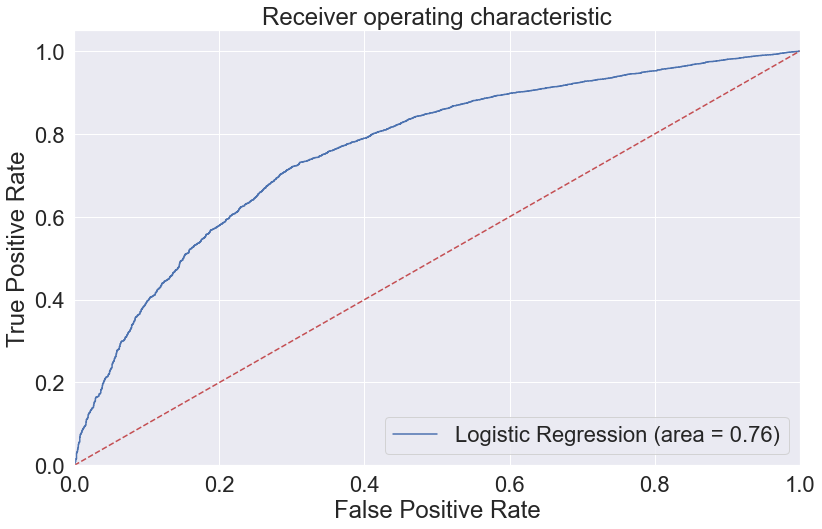

In [165]:
#AUC ROC curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

logit_roc_auc = roc_auc_score(y_test, lg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lg.predict(X_test))
plt.figure(figsize=(13,8))
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

Insight

Area under the curve is 0.77

Recall is 0.71 on train and 0.71 which is not very good. Evidence of underfitting 


# Decision Trees

# Split data

In [166]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.40, random_state=1)


In [167]:
##  Function to calculate recall score
def get_recall_score(model):
    '''
    model : classifier to predict values of X

    '''
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
    print("Recall on test set : ",metrics.recall_score(y_test,pred_test))

# Build Decision Tree Model

In [168]:
dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dTree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

In [169]:
prob_train = dTree.predict_proba(X_train)
pred_train = dTree.predict(X_train)

prob_test = dTree.predict_proba(X_test)
pred_test = dTree.predict(X_test)

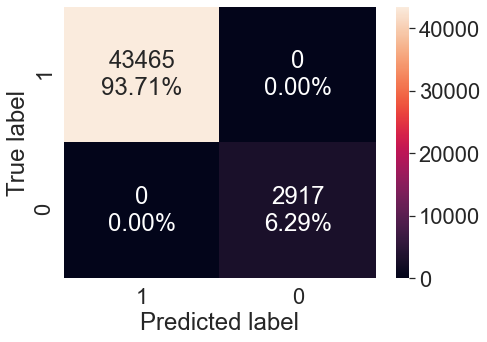

In [170]:
# confusion matrix on train set
make_confusion_matrix(y_train,pred_train)

Insight 

0 errors on train data, each sample has been classified correctly

A majority 93.71 True positive and 6.29 True negative

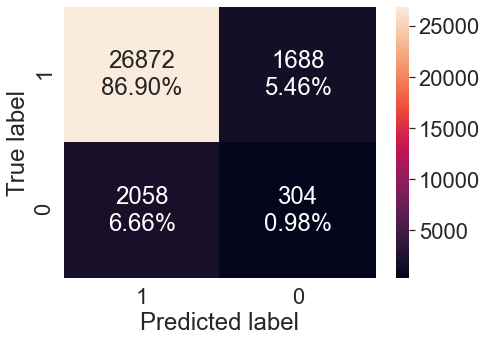

In [171]:
# confusion matrix on test set
make_confusion_matrix(y_test,pred_test)

Insight

True positive is lower at 86.90

false positive is at 5.46

False negative is 6.66

True negative is lower at 0.98 

In [172]:
print('Accuracy on train data:',accuracy_score(y_train, pred_train) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test))

print('Recall on train data:',recall_score(y_train, pred_train) )
print('Recall on test data:',recall_score(y_test, pred_test))

print('Precision on train data:',precision_score(y_train, pred_train) )
print('Precision on test data:',precision_score(y_test, pred_test))

print('f1 score on train data:',f1_score(y_train, pred_train) )
print('f1 score on test data:',f1_score(y_test, pred_test))

Accuracy on train data: 1.0
Accuracy on test data: 0.8788564775887717
Recall on train data: 1.0
Recall on test data: 0.9288627722087798
Precision on train data: 1.0
Precision on test data: 0.9408963585434174
f1 score on train data: 1.0
f1 score on test data: 0.9348408418855452


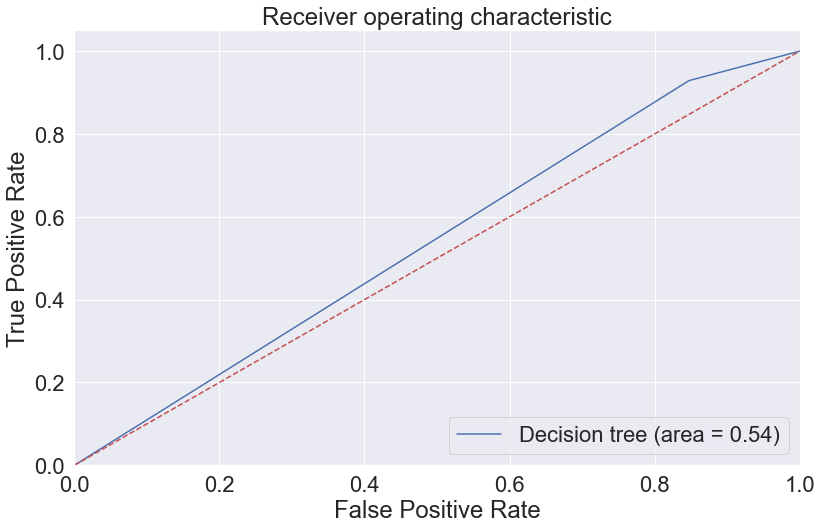

In [173]:
#AUC ROC curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

logit_roc_auc = roc_auc_score(y_test, dTree.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, dTree.predict_proba(X_test)[:,1])
plt.figure(figsize=(13,8))
plt.plot(fpr, tpr, label='Decision tree (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

Insight

Area under the curve is 0.54 

Recall on train is at 1.0 and on 0.92 on test 

Evidence of overfitting 

# Tree Visualization 

In [174]:
feature_names = list(X.columns)
print(feature_names)

['Premium_Cash', 'Age', 'Income', 'Marital_Stat', 'Veh_Owned', 'No_of_dep', 'Accomodation', 'Risk_score', 'No_premiums_paid', 'sourcing_channel', 'premium', 'ResidenceType_Rural', 'ResidenceType_Urban']


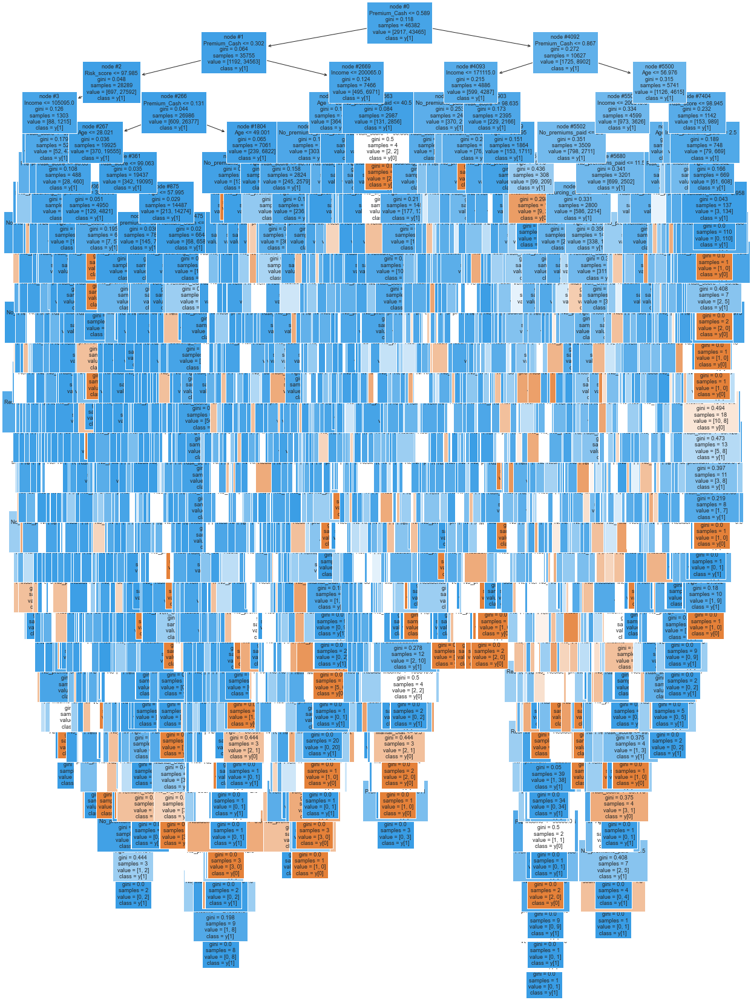

In [175]:
plt.figure(figsize=(20,30))
tree.plot_tree(dTree,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)
plt.show()

In [176]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(dTree.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                          Imp
Income               0.179465
Premium_Cash         0.174023
Age                  0.164848
Risk_score           0.151712
No_premiums_paid     0.079294
premium              0.066214
No_of_dep            0.041966
Veh_Owned            0.036498
sourcing_channel     0.030422
Marital_Stat         0.024111
Accomodation         0.019560
ResidenceType_Rural  0.016398
ResidenceType_Urban  0.015491


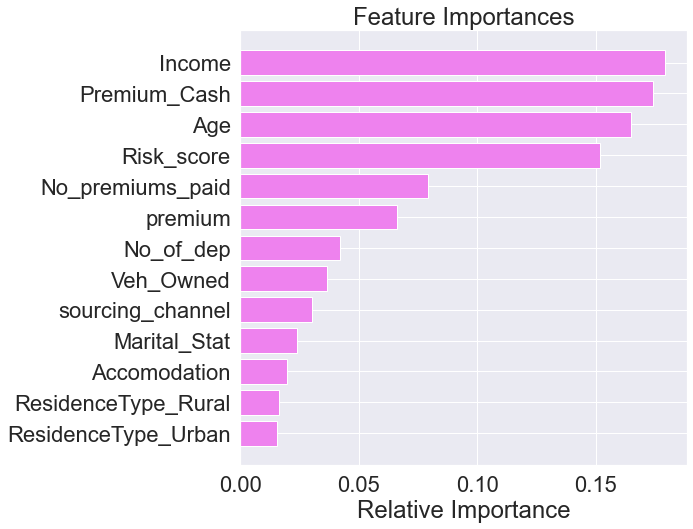

In [177]:
importances = dTree.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8,8))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [178]:
# Text report showing the rules of a decision tree -

print(tree.export_text(dTree,feature_names=feature_names,show_weights=True))

|--- Premium_Cash <= 0.59
|   |--- Premium_Cash <= 0.30
|   |   |--- Risk_score <= 97.99
|   |   |   |--- Income <= 105095.00
|   |   |   |   |--- Age <= 79.48
|   |   |   |   |   |--- Age <= 30.01
|   |   |   |   |   |   |--- Age <= 30.00
|   |   |   |   |   |   |   |--- No_premiums_paid <= 16.50
|   |   |   |   |   |   |   |   |--- No_of_dep <= 3.50
|   |   |   |   |   |   |   |   |   |--- weights: [0.00, 21.00] class: 1
|   |   |   |   |   |   |   |   |--- No_of_dep >  3.50
|   |   |   |   |   |   |   |   |   |--- Veh_Owned <= 1.50
|   |   |   |   |   |   |   |   |   |   |--- weights: [1.00, 0.00] class: 0
|   |   |   |   |   |   |   |   |   |--- Veh_Owned >  1.50
|   |   |   |   |   |   |   |   |   |   |--- weights: [0.00, 6.00] class: 1
|   |   |   |   |   |   |   |--- No_premiums_paid >  16.50
|   |   |   |   |   |   |   |   |--- Veh_Owned <= 2.00
|   |   |   |   |   |   |   |   |   |--- weights: [1.00, 0.00] class: 0
|   |   |   |   |   |   |   |   |--- Veh_Owned >  2.00
|   |  

Observation

In dTree, Income, Premium_cash,  Age and risk_score are the top 4 important features while the least 2 important features are  

ResidenceType_Rural and ResidenceType_Urban


# Hyperparameter through Grid Search  

In [179]:
#from sklearn.model_selection import GridSearchCV

# Choose the type of classifier. 
estimator = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {'max_depth': np.arange(6,15), 
              'min_samples_leaf': [1, 2, 5, 7, 10],
              'max_leaf_nodes' : [2, 3, 5, 10],
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(estimator, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
estimator.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=6, max_leaf_nodes=2, random_state=1)

In [180]:
prob_train = estimator.predict_proba(X_train)
pred_train = estimator.predict(X_train)

prob_test = estimator.predict_proba(X_test)
pred_test = estimator.predict(X_test)


In [181]:
print('Accuracy on train data:',accuracy_score(y_train, pred_train) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test))

print('Recall on train data:',recall_score(y_train, pred_train) )
print('Recall on test data:',recall_score(y_test, pred_test))

print('Precision on train data:',precision_score(y_train, pred_train) )
print('Precision on test data:',precision_score(y_test, pred_test))

print('f1 score on train data:',f1_score(y_train, pred_train) )
print('f1 score on test data:',f1_score(y_test, pred_test))

Accuracy on train data: 0.9371092234056315
Accuracy on test data: 0.9355798460642908
Recall on train data: 1.0
Recall on test data: 1.0
Precision on train data: 0.9371092234056315
Precision on test data: 0.9355798460642908
f1 score on train data: 0.9675336961723819
f1 score on test data: 0.9667179041636036


# Cost Complexity Pruning

In [182]:
clf = DecisionTreeClassifier(random_state=1)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [183]:
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.000000,0.000000
1,0.000010,0.000041
2,0.000011,0.000084
3,0.000011,0.000127
4,0.000011,0.000170
...,...,...
1136,0.000160,0.110699
1137,0.000237,0.110936
1138,0.000442,0.111379
1139,0.000616,0.111994


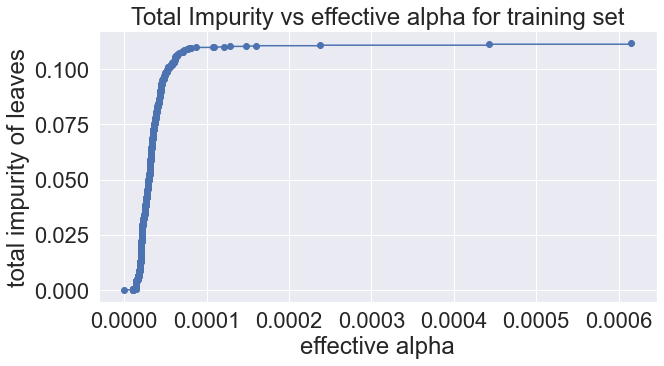

In [184]:
fig, ax = plt.subplots(figsize=(10,5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

Next, we train a decision tree using the effective alphas. The last value in ccp_alphas is the alpha value that prunes the whole tree, leaving the tree, clfs[-1], with one node.

In [185]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.005876961357238836


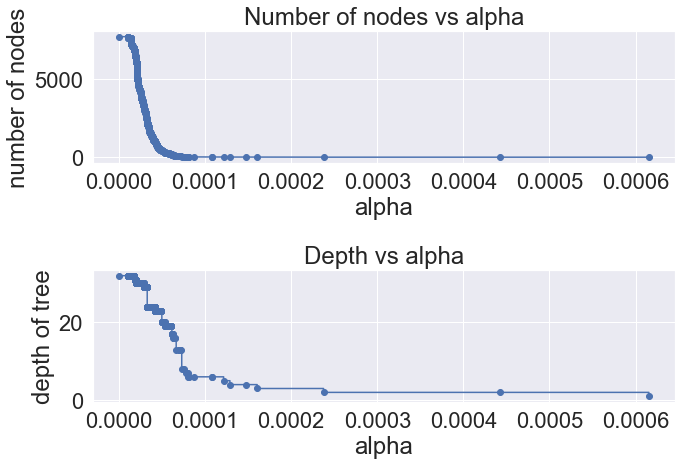

In [186]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1,figsize=(10,7))
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

# Recall vs alpha for training and testing sets

In [187]:
recall_train=[]
for clf in clfs:
    pred_train3=clf.predict(X_train)
    values_train=metrics.recall_score(y_train,pred_train3)
    recall_train.append(values_train)
    
recall_test=[]
for clf in clfs:
    pred_test3=clf.predict(X_test)
    values_test=metrics.recall_score(y_test,pred_test3)
    recall_test.append(values_test)

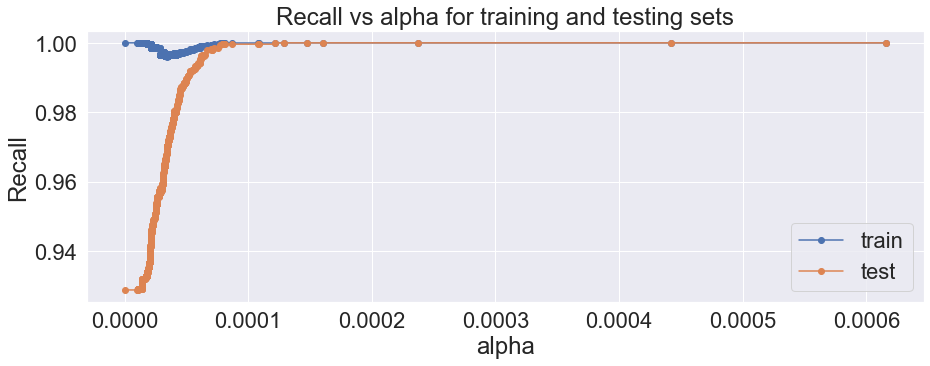

In [188]:
fig, ax = plt.subplots(figsize=(15,5))
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")
ax.plot(ccp_alphas, recall_train, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, recall_test, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [189]:
index_best_model = np.argmax(recall_test)
best_model = clfs[index_best_model]
print(best_model)

DecisionTreeClassifier(ccp_alpha=0.0001213804952324201, random_state=1)


In [190]:
prob_train = best_model.predict_proba(X_train)
pred_train = best_model.predict(X_train)

prob_test = best_model.predict_proba(X_test)
pred_test = best_model.predict(X_test)


print('Accuracy on train data:',accuracy_score(y_train, pred_train) )
print('Accuracy on test data:',accuracy_score(y_test, pred_test))

print('Recall on train data:',recall_score(y_train, pred_train) )
print('Recall on test data:',recall_score(y_test, pred_test))

print('Precision on train data:',precision_score(y_train, pred_train) )
print('Precision on test data:',precision_score(y_test, pred_test))

print('f1 score on train data:',f1_score(y_train, pred_train) )
print('f1 score on test data:',f1_score(y_test, pred_test))

Accuracy on train data: 0.9371092234056315
Accuracy on test data: 0.9355798460642908
Recall on train data: 1.0
Recall on test data: 1.0
Precision on train data: 0.9371092234056315
Precision on test data: 0.9355798460642908
f1 score on train data: 0.9675336961723819
f1 score on test data: 0.9667179041636036


Insight

Recall on train set and on test set are the same. The other sets are also very similiar in outputs

In [191]:
## Function to create confusion matrix
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [192]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[] 
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))
    
    return score_list # returning the list with train and test scores

# Building the model

# Gradient Boosting Classifier

In [193]:
gbc = GradientBoostingClassifier(random_state=1)
gbc.fit(X_train,y_train)

GradientBoostingClassifier(random_state=1)

In [194]:
#Using above defined function to get accuracy, recall and precision on train and test set
gbc_score=get_metrics_score(gbc)

Accuracy on training set :  0.9374757449010392
Accuracy on test set :  0.9355475066295841
Recall on training set :  0.9999539859657195
Recall on test set :  0.9996889042516419
Precision on training set :  0.9374905631888872
Precision on test set :  0.9358032680795988


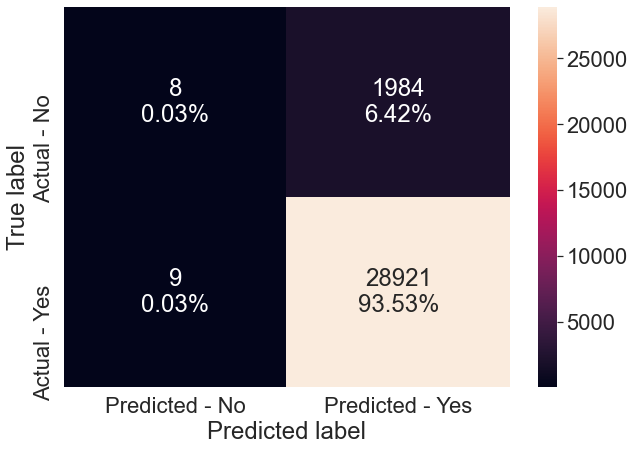

In [195]:
make_confusion_matrix(gbc,y_test)

# XGBoost Classifier

In [196]:
xgb = XGBClassifier(random_state=1)
xgb.fit(X_train,y_train)

[00:04:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=2, num_parallel_tree=1, random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [197]:
#Using above defined function to get accuracy, recall and precision on train and test set
xgb_score=get_metrics_score(xgb)

Accuracy on training set :  0.9466387822862318
Accuracy on test set :  0.9340598926330768
Recall on training set :  0.9997699298285977
Recall on test set :  0.9974766678188731
Precision on training set :  0.9463196864111498
Precision on test set :  0.9362164617331213


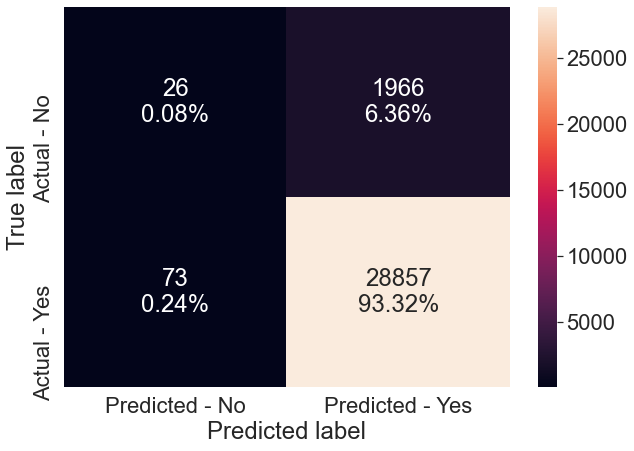

In [198]:
make_confusion_matrix(xgb,y_test)

Insight 

Accuracy on training and on test is performing better on XGB than on gradient boosting classifier 

Recall on training and test are just about the same between XGB and gradient boosting classifier


# Hyperparameter

# AdaBoost classifier as the estimator for initial predictions

In [199]:
gbc_init = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)
gbc_init.fit(X_train,y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           random_state=1)

In [200]:
#Using above defined function to get accuracy, recall and precision on train and test set
gbc_init_score=get_metrics_score(gbc_init)

Accuracy on training set :  0.9374110646371437
Accuracy on test set :  0.9353534700213441
Recall on training set :  0.9999769929828598
Recall on test set :  0.9996197718631179
Precision on training set :  0.937411033947289
Precision on test set :  0.935678001747177


In [201]:
# Choose the type of classifier. 
gbc_tuned = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(gbc_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
gbc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned.fit(X_train, y_train)
GradientBoostingClassifier()

GradientBoostingClassifier()

In [202]:
#Using above defined function to get accuracy, recall and precision on train and test set
gbc_tuned_score=get_metrics_score(gbc_tuned)

Accuracy on training set :  0.9371092234056315
Accuracy on test set :  0.9355798460642908
Recall on training set :  1.0
Recall on test set :  1.0
Precision on training set :  0.9371092234056315
Precision on test set :  0.9355798460642908


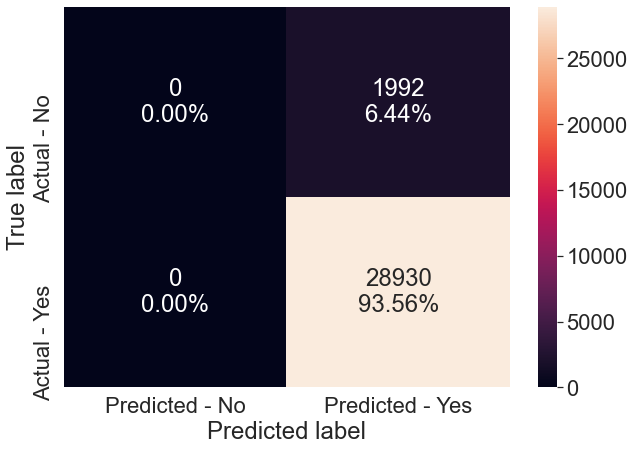

In [203]:
make_confusion_matrix(gbc_tuned,y_test)

Insight

True positive is lowered to 0.00 

false positive is at 0.00

False negative is 0.00

True negative is a bit higher from 93.32 to 93.56 



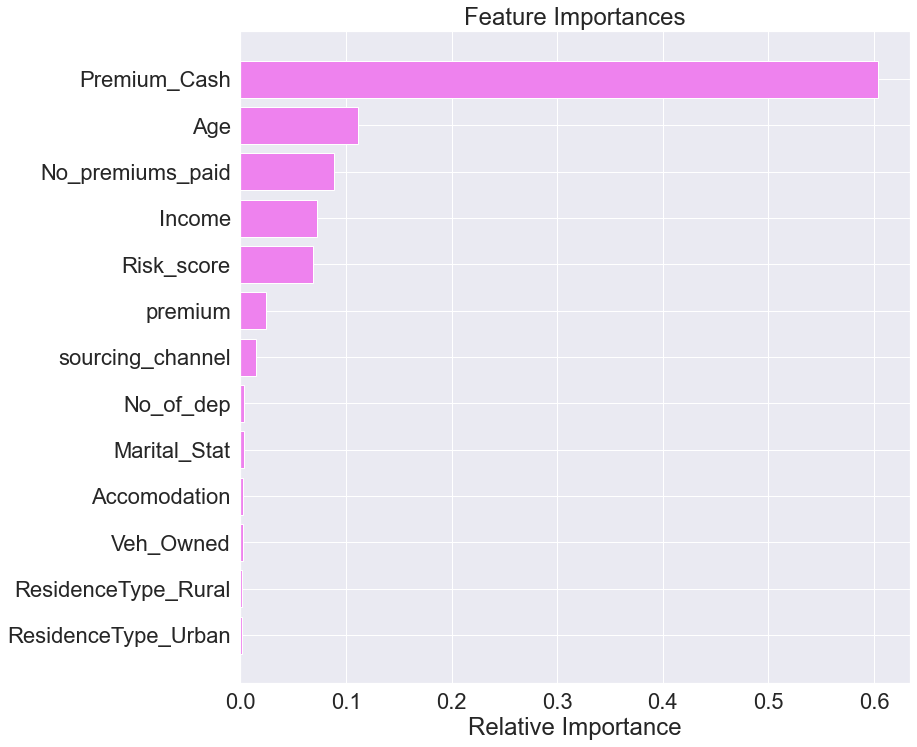

In [204]:
importances = gbc_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Insight

gbc_tuned indicated Premium_cash has the most feature importance feature by a very significant margin followed by Age and No premiums paid. 

ResidenceType_Rural and residence Type Urban have the least feature importance


In [207]:
Measures = {'Logistic Regression':[0.93, 0.93, 0.99, 1.0, 0.93, 0.93, 0.96, 0.96],
        'LR with opt threshold':  [0.71, 0.71, 0.71, 0.71, 0.97, 0.97, 0.82, 0.82],
        'Decision Tree': [0.71, 0.71, 0.71, 0.71, 0.97, 0.97, 0.82, 0.82],
        'Decision Tree Pruned': [0.93, 0.93, 1.0, 1.0, 0.93, 0.93, 0.96, 0.96],  
        'XGB': [0.94, 0.93, 0.99, 0.99, 0.94, 0.93, 0.0, 0.0 ],     
        'GBC_tuned_init': [0.93, 0.93, 0.99, 0.99, 0.93, 0.93, 0.0, 0.0],   
        'GBC_tuned': [0.93, 0.93, 1.0, 1.0, 0.93, 0.93, 0.0, 0.0],
           }

    


dff = pd.DataFrame(Measures, columns = ['Logistic Regression','LR with opt threshold', 'Decision Tree','Decision Tree Pruned','XGB','GBC_tuned_init','GBC_tuned'],
                  index=['Train_accuracy','Test_accuracy','Train_Recall','Test_Recall','Train_precision','Test_precision','Train_f1_score','Test_f1_score'])

dff.T

,Train_accuracy,Test_accuracy,Train_Recall,Test_Recall,Train_precision,Test_precision,Train_f1_score,Test_f1_score
Logistic Regression,0.93,0.93,0.99,1.00,0.93,0.93,0.96,0.96
LR with opt threshold,0.71,0.71,0.71,0.71,0.97,0.97,0.82,0.82
Decision Tree,0.71,0.71,0.71,0.71,0.97,0.97,0.82,0.82
Decision Tree Pruned,0.93,0.93,1.00,1.00,0.93,0.93,0.96,0.96
XGB,0.94,0.93,0.99,0.99,0.94,0.93,0.00,0.00
GBC_tuned_init,0.93,0.93,0.99,0.99,0.93,0.93,0.00,0.00
GBC_tuned,0.93,0.93,1.00,1.00,0.93,0.93,0.00,0.00


# Business Insights and Recommendation

Its evident that premium cash, income, age, and risk score are significant in determining possible defaulters. Customers 
with premium cash less than or equal to 59, premium cash less than or equal to 30 and risk score less than 97.99 are likely to default.

The least amount of default is evident in the age range 80-100 while the most default is evident in the age range 40-50

Customers with 3 dependents and 4 dependents showed the most defaults respectively. 

Of the sourcing channels, sourcing Channel A contains the highest amount customers who have defaulted and customers who have
not defaulted

No of vehicles owned and residenceType and marital status have very little impact on default

While the model was able to address areas of concern for the insurance company, it is worth noting areas for improvement within the model. The dataset being unbalanced could have been adjusted (as outlined earlier) to achieve a more robust and objective analysis. 
